## Часть I

### Задание 1
Произошло убийство. На месте убийства найдена кровь, которая явно (будем считать, что с вероятностью 1) принадлежит настоящему убийце. Кровь принадлежит редкой группе, которая присутствует всего лишь у 1% населения. И так получилось, что у подсудимого как раз эта редкая группа крови!
Первым выходит прокурор и говорит: “Шанс, что у подсудимого была бы именно такая группа крови, если бы он был невиновен -- всего 1%; значит, с вероятностью 99% он виновен, предлагаю осудить”. В чём не прав прокурор? Укажите, какие вероятности он оценил, а какие должен был оценить.

### Ответ
Прокурор оценил вероятность вины **только** при условии совпадения группы крови. Под эту вероятность попадают все люди с такой группой крови, а не только этот подсудимый.
Правильная оценка вероятности должна учитывать и другие заведомо известные данные, например размер популяции с такой же группой крови.

Пускай **y** - событие вины подсудимого, **x** - событие совпадения группы крови, **X** - все пространство событий, имеющих отношение к данному судебнмоу процессу. В нашем случае прокурор оценил лишь апостериорную вероятность при условии одного события:  
$$ p(y | x) = \frac{p(x|y) p(y)}{p(x)} $$
Тогда как ему следовало бы оценить вероятность при условии полного набора событий:
$$ p(y | X) = \frac{p(X|y) p(y)}{p(X)} $$

### Задание 2
Затем выходит адвокат, объясняет ошибки прокурора и берёт слово сам: “В городе живёт миллион человек. Это значит, что примерно у 10000 из них такая группа крови. Значит, всё, что говорит нам эта кровь -- это то, что подсудимый совершил убийство с вероятностью 0.01%. Получается, что это свидетельство не просто не является строгим доказательством, а и вовсе даёт нам ничтожно малую вероятность того, что мой подзащитный виновен, так что предлагаю исключить его из материалов дела”. В чём не прав адвокат? Какие вероятности он оценил, а какие должен был оценить.

### Ответ
Адвокат оценил **только** априорную вероятность убийства любым человеком с совпавшей группой крови, при этом не беря во внимание никакие другие доказательства вины подсудимого.

Пользуясь переменными, определенными в ответе на предыдущий вопрос, адвокат оценил только **p(y)**, а должен был оценить **p(y|X)**


### Задание 3
Вернёмся к тесту на страшную болезнь из первой лекции. Напомню, что по предположениям задачи болеет 1% населения, а тест имеет вероятность ошибки 5% в обе стороны. Мы видели, что в результате человек с положительным тестом имеет апостериорную вероятность оказаться больным всего лишь около 16%.
Врачи решили, что терпеть это никак нельзя; они готовы провести срочное исследование и улучшить качество теста. Но сил и денег хватит только для того, чтобы сократить один тип ошибок, т.е. уменьшить или только число false positives (когда тест выдаёт положительный результат у здорового человека), или только число false negatives (когда тест выдаёт отрицательный результат у больного).
Помогите медикам: постройте зависимости апостериорной вероятности болезни после положительного и отрицательного теста от обоих видов ошибок (например, в виде графиков), сделайте выводы и дайте рекомендации врачам -- на чём лучше сосредоточиться?


In [1]:
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import rc
rc('font',**{'family':'sans-serif'})
rc('figure', **{'dpi': 300})

sns.set_style("whitegrid")
sns.set_palette("colorblind")
palette = sns.color_palette()
figsize = (15,8)
legend_fontsize = 16
#%matplotlib inline

Апостериорная вероятность после положительного теста: 0.161017
Апостериорная вероятность после отрицательного теста: 0.000531
Вероятности после положительного теста при сдвиге правдоподобия:
[0.08333333 0.0855045  0.08777886 0.09016393 0.09266802 0.09530026
 0.09807074 0.10099064 0.1040724  0.10732984 0.11077844 0.11443553
 0.11832061 0.12245568 0.12686567 0.13157895 0.13662791 0.14204974
 0.14788732 0.1541904  0.16101695 0.16843501 0.17652495 0.18538238
 0.19512195 0.20588235 0.21783296 0.2311828  0.24619289 0.2631935
 0.2826087  0.3049922  0.33108108 0.36187845 0.39878543 0.44382022
 0.5        0.57204611 0.66778523 0.80120482]
Вероятности после отрицательного:
[1.12107623e-03 1.09005534e-03 1.05920392e-03 1.02852060e-03
 9.98003992e-04 9.67652751e-04 9.37465534e-04 9.07441016e-04
 8.77577885e-04 8.47874843e-04 8.18330606e-04 7.88943903e-04
 7.59713479e-04 7.30638091e-04 7.01716507e-04 6.72947510e-04
 6.44329897e-04 6.15862475e-04 5.87544066e-04 5.59373502e-04
 5.31349628e-04 5.03471

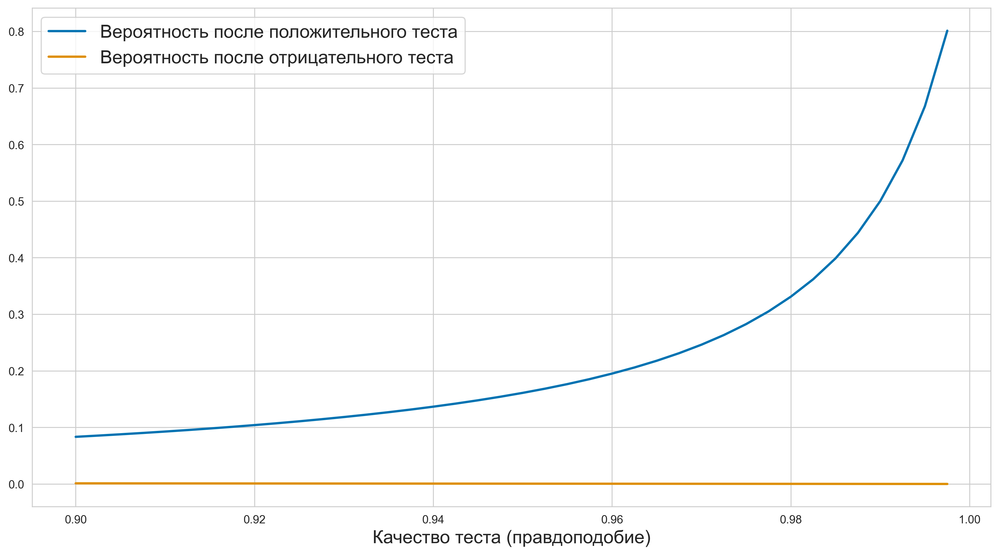

In [2]:
## если data = 1, тест положительный
def compute_posterior(data, prior_prob=0.01, test_success=0.95):
    if data == 1:
        return (prior_prob * test_success) / (prior_prob * test_success + (1-prior_prob) * (1-test_success))
    elif data == 0:
        return (prior_prob * (1-test_success)) / (prior_prob * (1-test_success) + (1-prior_prob) * test_success)
    else:
        return None

print("Апостериорная вероятность после положительного теста: %.6f" % compute_posterior(1) )
print("Апостериорная вероятность после отрицательного теста: %.6f" % compute_posterior(0) )

vector_posterior = np.vectorize(compute_posterior, excluded=['data', 'test_success'])
xs = np.arange(0.9, 1, 0.0025)
ys_one = vector_posterior(1, test_success=xs)
ys_zero = vector_posterior(0, test_success=xs)
print('Вероятности после положительного теста при сдвиге правдоподобия:')
print(ys_one)
print('Вероятности после отрицательного:')
print(ys_zero)
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
ax.plot(xs, ys_one, linewidth=2, label='Вероятность после положительного теста')
ax.plot(xs, ys_zero, linewidth=2, label='Вероятность после отрицательного теста')
ax.set_xlabel('Качество теста (правдоподобие)', fontsize=legend_fontsize)
ax.legend(fontsize=legend_fontsize)
# fig.savefig('intro1.pdf', bbox_inches='tight')
plt.show()

Из графика можем заметить, что при сокращении ошибок типа **False Positive** происходит экспоненциальный рост апостериорной вероятности, тогда как при сокращении ошибок типа **False Negative**, вероятность болезни остается около нуля. Следовательно, ученым стоило бы сосредоточиться над разработкой такой версии теста, в котором случаи положительного результата у здорового человека были бы минимальны.

## Часть II

In [3]:
import pandas as pd
from sklearn.linear_model import LinearRegression

In [4]:
df = pd.read_csv('owid-covid-data.csv')
df.loc[:, 'new_cases'] = np.where(df['new_cases'] < 1, 1, df['new_cases'])
df = df[(df['location'] == 'Russia') & (df['date'] > '2020-03-01')].reset_index(drop=True)
# X is day
df['day'] = df.index + 1
train = df.iloc[:50,:]
train.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,day
0,RUS,Europe,Russia,2020-03-02,3.0,1.0,0.143,NaN,NaN,0.0,...,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824,1
1,RUS,Europe,Russia,2020-03-03,3.0,1.0,0.143,NaN,NaN,0.0,...,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824,2
2,RUS,Europe,Russia,2020-03-04,3.0,1.0,0.143,NaN,NaN,0.0,...,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824,3
3,RUS,Europe,Russia,2020-03-05,4.0,1.0,0.286,NaN,NaN,0.0,...,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824,4
4,RUS,Europe,Russia,2020-03-06,13.0,9.0,1.571,NaN,NaN,0.0,...,0.1,431.297,6.18,23.4,58.3,NaN,8.05,72.58,0.824,5


Посмотрим на графики целевых пременных

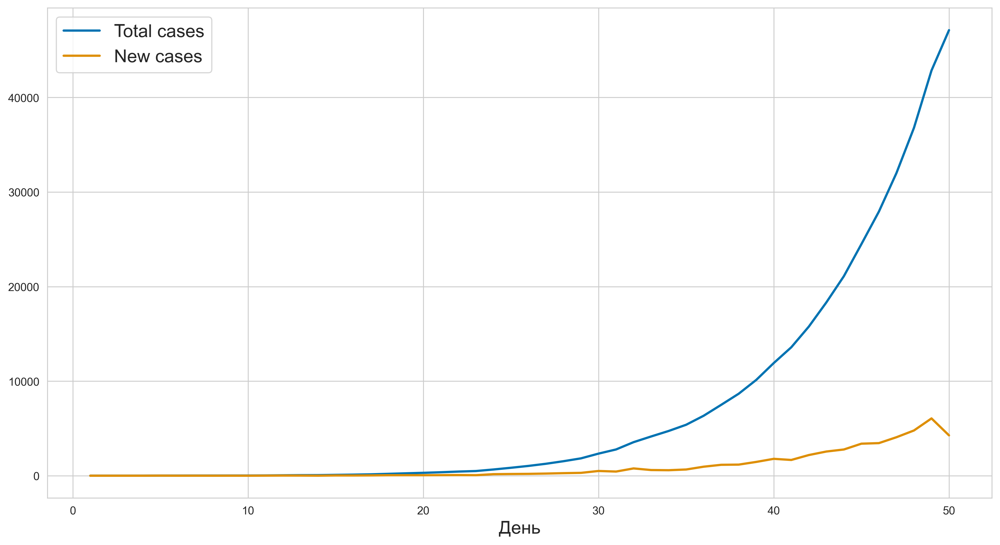

In [5]:
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
ax.plot(train['day'], train['total_cases'], linewidth=2, label='Total cases')
ax.plot(train['day'], train['new_cases'], linewidth=2, label='New cases')
ax.set_xlabel('День', fontsize=legend_fontsize)
ax.legend(fontsize=legend_fontsize)
plt.show()

### Моделирование экспоненциального роста

Обучим линейную регрессию исходя из предположения об экспоненциальном росте заболеваний

In [6]:
X = train['day'].values
y = np.log(train['total_cases'])
lr_exp = LinearRegression()
lr_exp.fit(X.reshape(-1, 1), y)
# print (lr_exp.intercept_, lr_exp.coef_)
# def lr_curve(lr, x):
#     return lr.intercept_ + lr.coef_[0]*x

LinearRegression()

Получим предсказания этой модели для оценки шума в данных

In [7]:
mle_preds = lr_exp.predict(X.reshape(-1, 1))

Функции для сэмплирования и байесовского вывода

In [8]:
def sample_statistics(mu, sigma, xs, n=20):
    my_w = np.random.multivariate_normal(mu, sigma, n)
    res = np.zeros((n, xs.shape[0]))
    for i,w in enumerate(my_w):
        res[i,:] = w[0] + w[1]*xs
    return res

In [9]:
def bayesian_update(mu, sigma, x, y, sigma_noise=.25):
    x_matrix = np.array([[1, x]])
    sigma_n = np.linalg.inv( np.linalg.inv(sigma) + (1 / (sigma_noise ** 2)) * np.matmul(np.transpose(x_matrix), x_matrix) )
    mu_n = np.matmul(sigma_n, np.matmul(np.linalg.inv(sigma), np.transpose(mu)) + (1 / (sigma_noise ** 2)) * np.matmul(np.transpose(x_matrix), np.array([y]) ) )
    return mu_n, sigma_n

Функция для визуализации распределений

In [10]:
def plot_predictions(xs, obs, mu, x_sampled):
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    model_curve = np.exp(mu[0] + mu[1]*xs)
    noise = np.std(model_curve - obs)
    ax.plot(xs, obs, linewidth=2, label='Наблюдения')
    ax.plot(xs, model_curve, linewidth=2, label='MAP гипотеза (lin reg)')
    ax.fill_between(xs, obs - noise, obs + noise, color=palette[0], alpha=.3, label="+- дисперсия шума")
    ax.fill_between(xs, np.mean(x_sampled, axis=0) - np.std(x_sampled, axis=0),
                    np.mean(x_sampled, axis=0) + np.std(x_sampled, axis=0), color=palette[5], alpha=.2, label="+- дисперсия предсказаний")
    ax.set_xlabel('День', fontsize=legend_fontsize)
    ax.set_xlim(xs[0], xs[-1])
    ax.legend(fontsize=legend_fontsize)
    plt.show()

In [11]:
#example after 1 iteration
cur_mu, cur_sigma = np.array([0, 0]), 2*np.array([[1, 0], [0, 1]])
cur_mu, cur_sigma = bayesian_update(cur_mu, cur_sigma, X[0], y[0]) #np.array(train['day'])
print (cur_mu, cur_sigma)

[0.54085528 0.54085528] [[ 1.01538462 -0.98461538]
 [-0.98461538  1.01538462]]


Обновляем параметры по всей обучающей выборке 

In [12]:
mle_noise = np.exp(np.std(mle_preds - y))
cur_mu, cur_sigma = np.array([0, 0]), 2*np.array([[1, 0], [0, 1]])
for i in range(len(train)):
    cur_mu, cur_sigma = bayesian_update(cur_mu, cur_sigma, X[i], y[i], mle_noise)
print (cur_mu, cur_sigma)

[1.2523167  0.20416635] [[ 0.1509817  -0.0044845 ]
 [-0.0044845   0.00017935]]


In [13]:
# version with sklearn lin-reg
# def plot_predictions(xs, obs, lr_model, x_sampled):
#     fig = plt.figure(figsize=figsize)
#     ax = fig.add_subplot(111)
# #     xs = train['day'].values
# #     obs = train['total_cases']
#     model_curve = np.exp(lr_curve(lr_model, xs))
#     ax.plot(xs, obs, linewidth=2, label='Наблюдения')
#     ax.plot(xs, model_curve, linewidth=2, label='MAP гипотеза (lin reg)')
#     ax.fill_between(xs, obs - obs.std(), obs + obs.std(), color=palette[0], alpha=.3, label="+- дисперсия шума")
#     ax.fill_between(xs, np.mean(x_sampled, axis=0) - np.std(x_sampled, axis=0),
#                     np.mean(x_sampled, axis=0) + np.std(x_sampled, axis=0), color=palette[5], alpha=.2, label="+- дисперсия предсказаний")
#     ax.set_xlabel('День', fontsize=legend_fontsize)
#     ax.set_xlim(xs[0], xs[-1])
#     ax.legend(fontsize=legend_fontsize)
#     plt.show()

Рисуем графики распределений

Первые 50 дней (обучающая выборка)

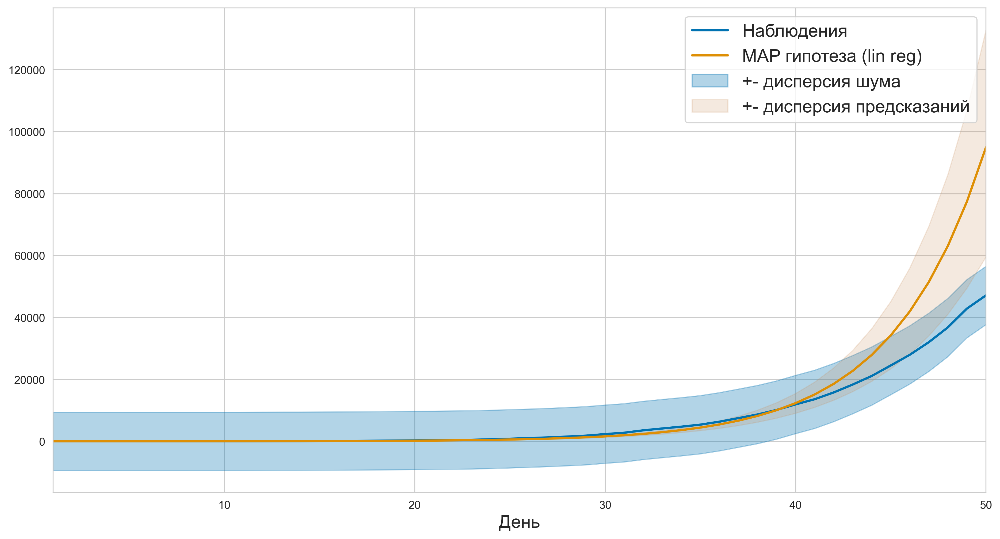

In [14]:
x_sampled = np.exp(sample_statistics(cur_mu, cur_sigma, X, n=100))
plot_predictions(X, train['total_cases'], cur_mu, x_sampled)

Предсказания к 1 мая

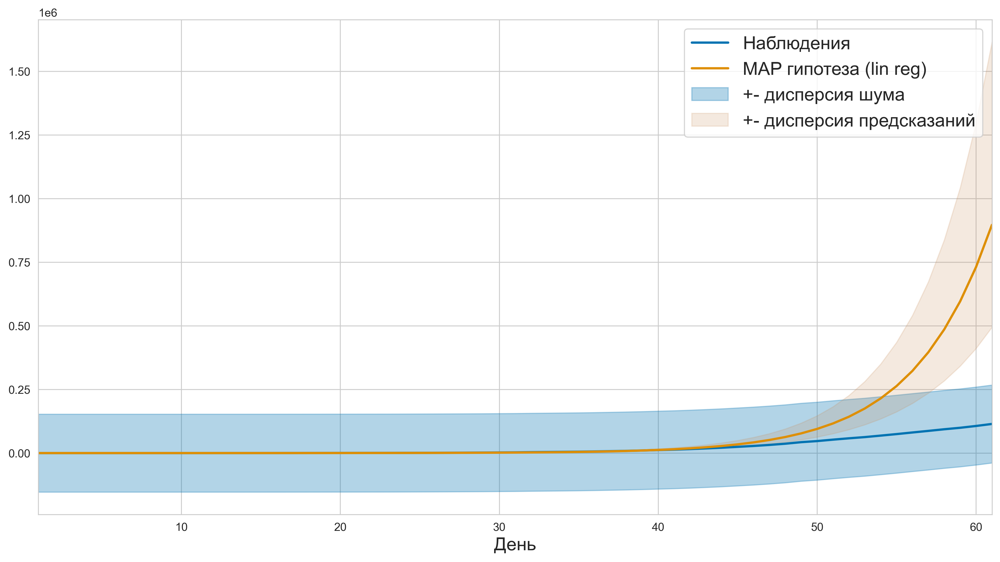

In [15]:
new_X = df.iloc[:df[df['date'] == '2020-05-01'].index[0] + 1]['day'].values
new_y = df.iloc[:df[df['date'] == '2020-05-01'].index[0] + 1]['total_cases']
x_sampled = np.exp(sample_statistics(cur_mu, cur_sigma, new_X, n=100))
plot_predictions(new_X, new_y, cur_mu, x_sampled)

Предсказания к 1 июня

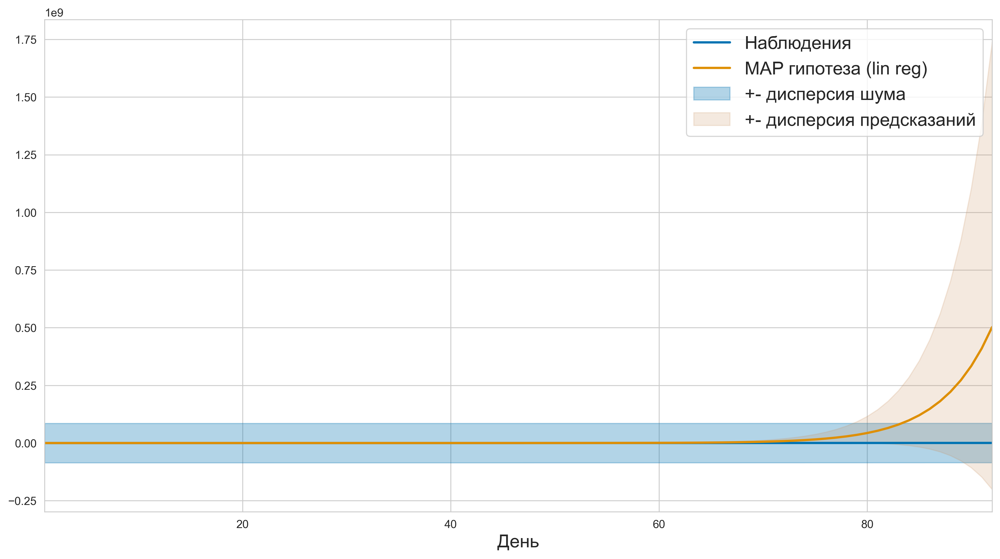

In [16]:
new_X = df.iloc[:df[df['date'] == '2020-06-01'].index[0] + 1]['day'].values
new_y = df.iloc[:df[df['date'] == '2020-06-01'].index[0] + 1]['total_cases']
x_sampled = np.exp(sample_statistics(cur_mu, cur_sigma, new_X, n=100))
plot_predictions(new_X, new_y, cur_mu, x_sampled)

Предсказания к 1 сентября

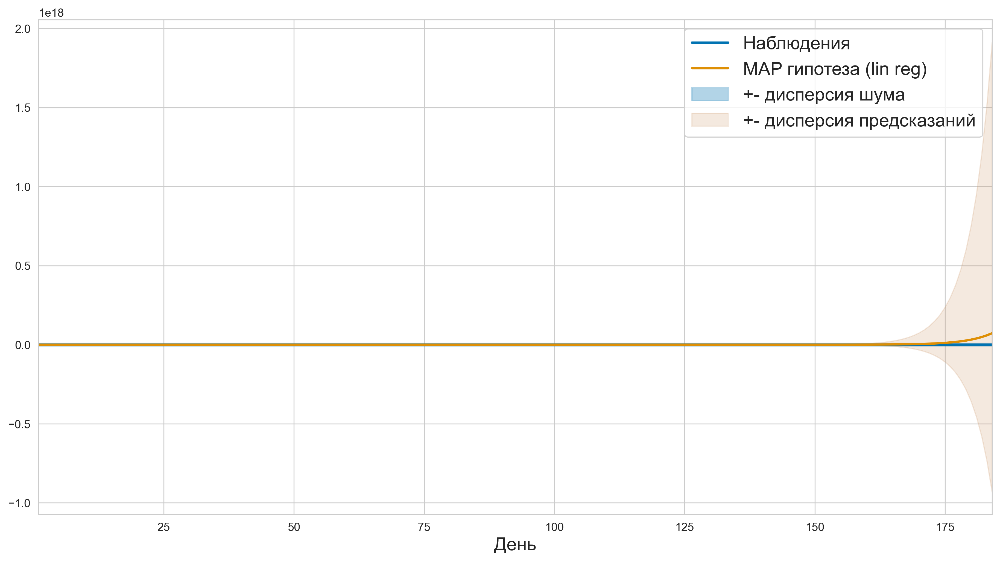

In [17]:
new_X = df.iloc[:df[df['date'] == '2020-09-01'].index[0] + 1]['day'].values
new_y = df.iloc[:df[df['date'] == '2020-09-01'].index[0] + 1]['total_cases']
x_sampled = np.exp(sample_statistics(cur_mu, cur_sigma, new_X, n=100))
plot_predictions(new_X, new_y, cur_mu, x_sampled)

Можем сделать вывод, что хоть на первых порах предсказания и были близки к наблюдениям, довольно быстро дисперсия увеличилась до огромных масштабов, и уже к осени верхняя граница дисперсии предсказаний во много раз стала превышать все население планеты.

### Сигмоида

Теперь обучим линейную регрессию исходя из предположения о сигмоидальном росте кол-ва заболеваний. Формула линейной регрессии теперь примет вид:

$$lny = w_0 + w_1x + w_2x^2$$
где **y** - кол-во новых случаев (производная от общего кол-ва случаев), **x** - день наблюдений

In [18]:
df['day_squared'] = df['day'] ** 2
train = df.iloc[:50,:]

y = np.log(train['new_cases'])
X = train[['day', 'day_squared']].values
lr_new = LinearRegression()
lr_new.fit(X, y)
mle_preds = lr_new.predict(X)

Посмотрим предсказания такой MLE-гипотезы к 1 сентября. Делим итоговые предсказания на 2 из интуитивных соображений

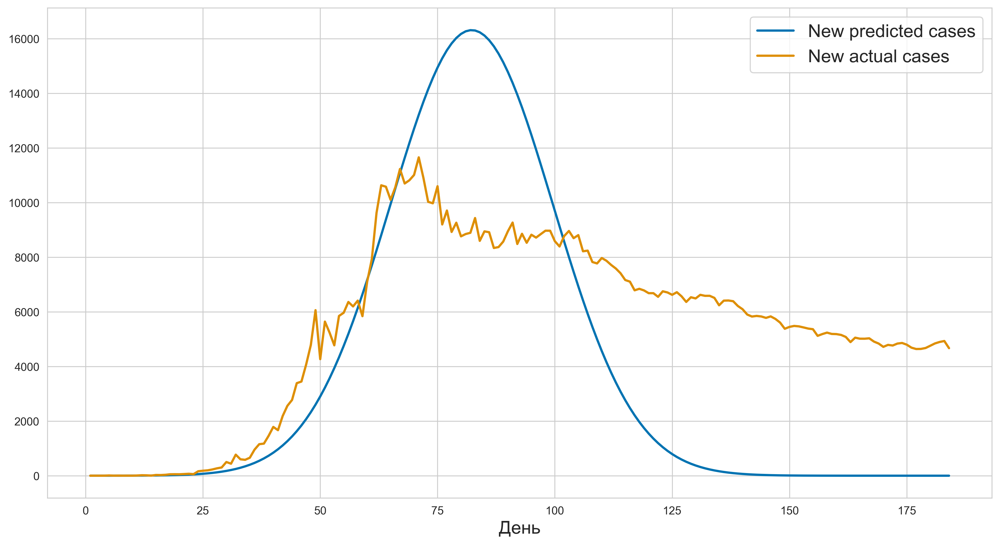

In [19]:
new_X = (df.iloc[:df[df['date'] == '2020-09-02'].index[0]][['day', 'day_squared']]).values
new_y = df.iloc[:df[df['date'] == '2020-09-02'].index[0]]['new_cases']
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
ax.plot(new_X[:, 0], np.exp(lr_new.predict(new_X)) / 2, linewidth=2, label='New predicted cases')
ax.plot(new_X[:, 0], new_y, linewidth=2, label='New actual cases')
ax.set_xlabel('День', fontsize=legend_fontsize)
#ax.set_ylim(0, 25)
ax.legend(fontsize=legend_fontsize)
plt.show()

Видим, что получилось предсказать первую волну коронавируса намного лучше, чем исходя из предположений об экспоненциальном росте

Теперь давайте найдем веса модели с помощью байесовского вывода

Функции для сэмплирования и байесовского вывода (модернизация для полинома 2-й степени)

In [20]:
def sample_statistics_poly(mu, sigma, xs, n=20):
    my_w = np.random.multivariate_normal(mu, sigma, n)
    res = np.zeros((n, xs.shape[0]))
    for i, w in enumerate(my_w):
        res[i,:] = w[0] + w[1]*xs[:, 0] + w[2]*xs[:, 1]
    return res

In [21]:
def bayesian_update_poly(mu, sigma, x, y, sigma_noise=.25):
    x_matrix = np.array([[1, x[0], x[1]]])
    sigma_n = np.linalg.inv( np.linalg.inv(sigma) + (1 / (sigma_noise ** 2)) * np.matmul(np.transpose(x_matrix), x_matrix) )
    mu_n = np.matmul(sigma_n, np.matmul(np.linalg.inv(sigma), np.transpose(mu)) + (1 / (sigma_noise ** 2)) * np.matmul(np.transpose(x_matrix), np.array([y]) ) )
    return mu_n, sigma_n

Функция для визуализации распределений

In [22]:
def plot_predictions_poly(xs, obs, mu, x_sampled):
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    model_curve = np.cumsum(np.exp(mu[0] + mu[1]*xs[:, 0] + mu[2]*xs[:, 1]))
    xs = xs[:, 0]
    noise = np.std(model_curve - obs)
    ax.plot(xs, obs, linewidth=2, label='Наблюдения')
    ax.plot(xs, model_curve, linewidth=2, label='MAP гипотеза (lin reg)')
    ax.fill_between(xs, obs - noise, obs + noise, color=palette[0], alpha=.3, label="+- дисперсия шума")
    ax.fill_between(xs, np.mean(x_sampled, axis=0) - np.std(x_sampled, axis=0), 
                    np.mean(x_sampled, axis=0) + np.std(x_sampled, axis=0), color=palette[5], alpha=.2, label="+- дисперсия предсказаний")
    ax.set_xlabel('День', fontsize=legend_fontsize)
    ax.set_xlim(xs[0], xs[-1])
    ax.legend(fontsize=legend_fontsize)
    plt.show()

Итеративно обновляем весы учитывая шум в данных, полученный по первым 50 дням трейн-выборки

In [23]:
mle_noise = np.std(mle_preds - y) / 2
cur_mu, cur_sigma = np.zeros(3), 2 * np.eye(3)
for i in range(len(train)):
    cur_mu, cur_sigma = bayesian_update_poly(cur_mu, cur_sigma, X[i], y[i], mle_noise)
print (cur_mu, cur_sigma)

[-0.82328772  0.27235325 -0.00165077] [[ 1.19615452e-02 -9.47283463e-04  1.56316504e-05]
 [-9.47283463e-04  9.80091674e-05 -1.80706619e-06]
 [ 1.56316504e-05 -1.80706619e-06  3.54559124e-08]]


Теперь насэмплируем много сигмоид из данного апостериорного распределения и оценим предсказания к 1 января 2021 года

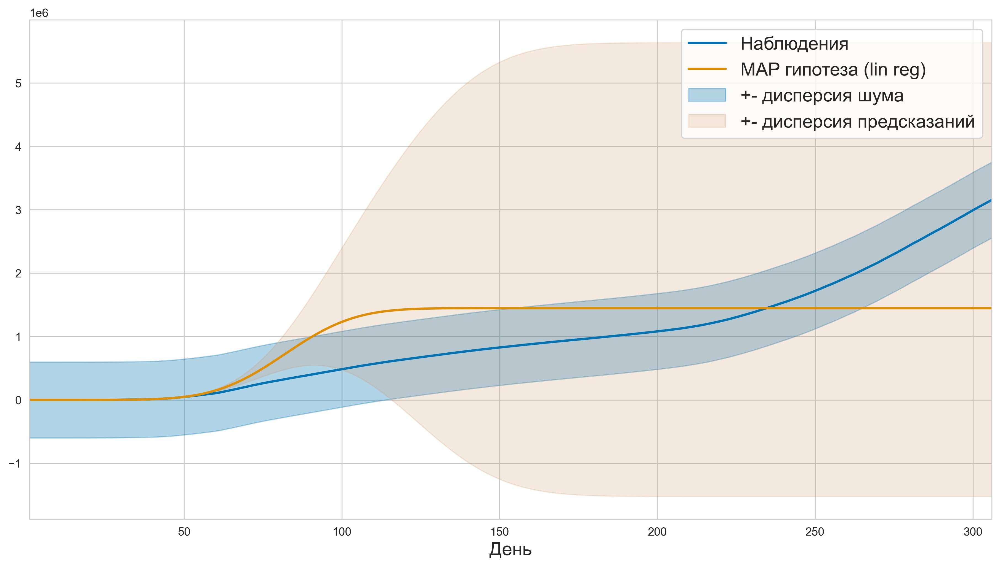

90-й перцентиль (пессимистичный прогноз): 3637047 человек
10-й перцентиль (оптимистичный прогноз): 700324 человек


In [24]:
new_X = (df.iloc[:df[df['date'] == '2021-01-02'].index[0]][['day', 'day_squared']]).values
new_y = df.iloc[:df[df['date'] == '2021-01-02'].index[0]]['total_cases']
x_sampled = np.cumsum(np.exp(sample_statistics_poly(cur_mu, cur_sigma, new_X, n=1000)), axis=1)
plot_predictions_poly(new_X, new_y, cur_mu, x_sampled)
print('90-й перцентиль (пессимистичный прогноз):', int(np.percentile(x_sampled[:, x_sampled.shape[1] - 1], 90)), 'человек')
print('10-й перцентиль (оптимистичный прогноз):', int(np.percentile(x_sampled[:, x_sampled.shape[1] - 1], 10)), 'человек')

Получили намного более реалистичные цифры! Но видно, что все разброс остался довольно большим, и предсказать вторую волну роста заболеваний не удалось.

## Моделирование для других стран

In [25]:
from mpl_toolkits.mplot3d import Axes3D

In [26]:
df = pd.read_csv('owid-covid-data.csv')
df.loc[:, 'new_cases'] = np.where(df['new_cases'] < 1, 1, df['new_cases'])
df['new_cases'] = df['new_cases'].fillna(1)
df['date'] = pd.to_datetime(df['date'])

Afghanistan


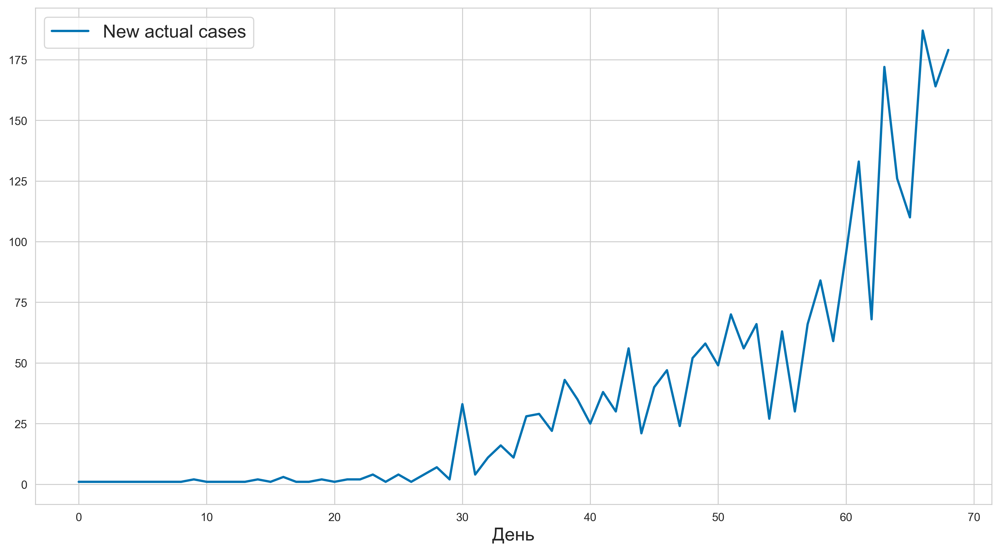

Algeria


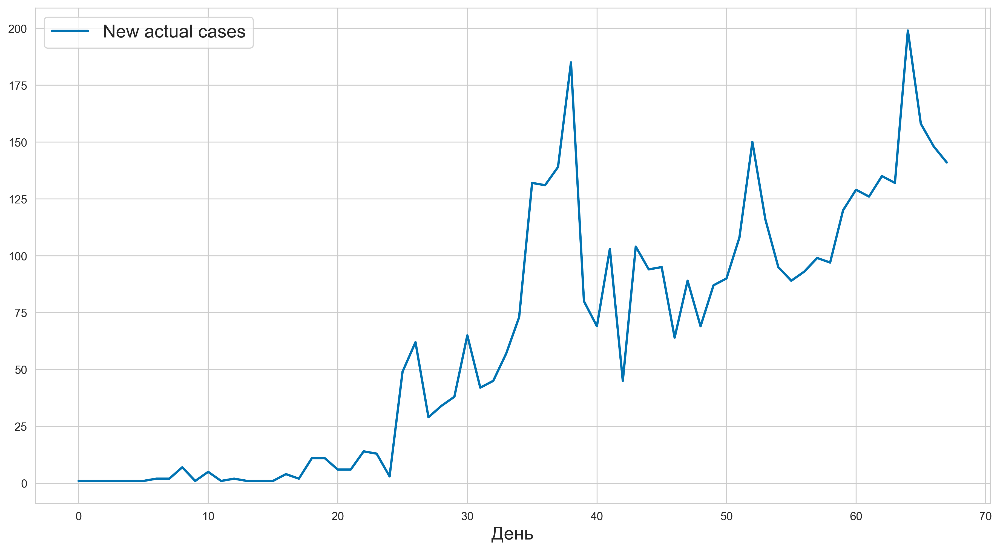

Angola


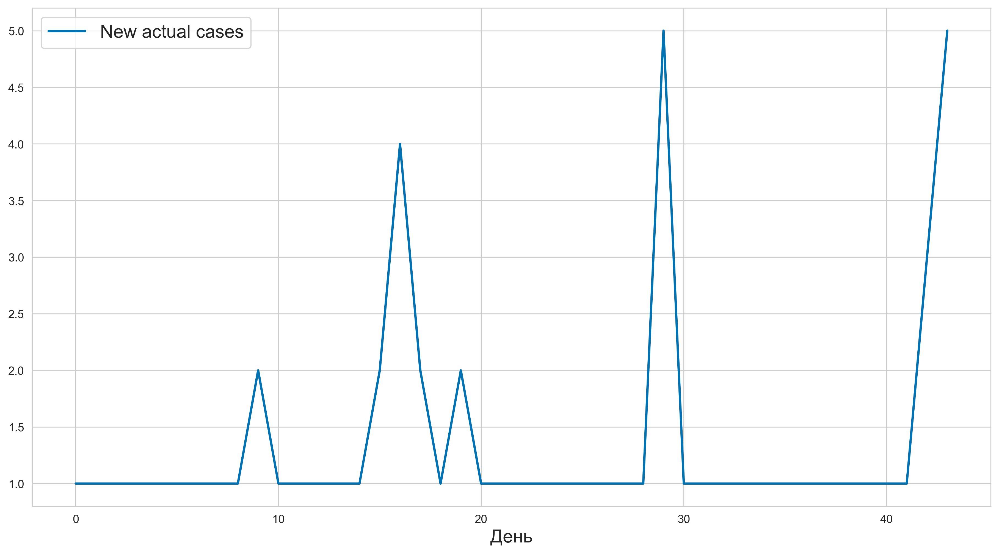

Argentina


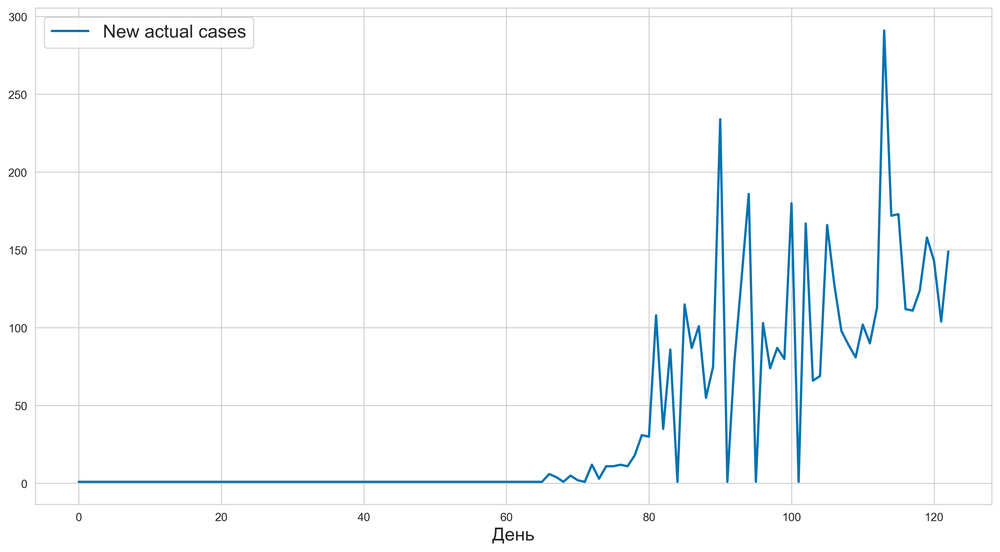

Australia


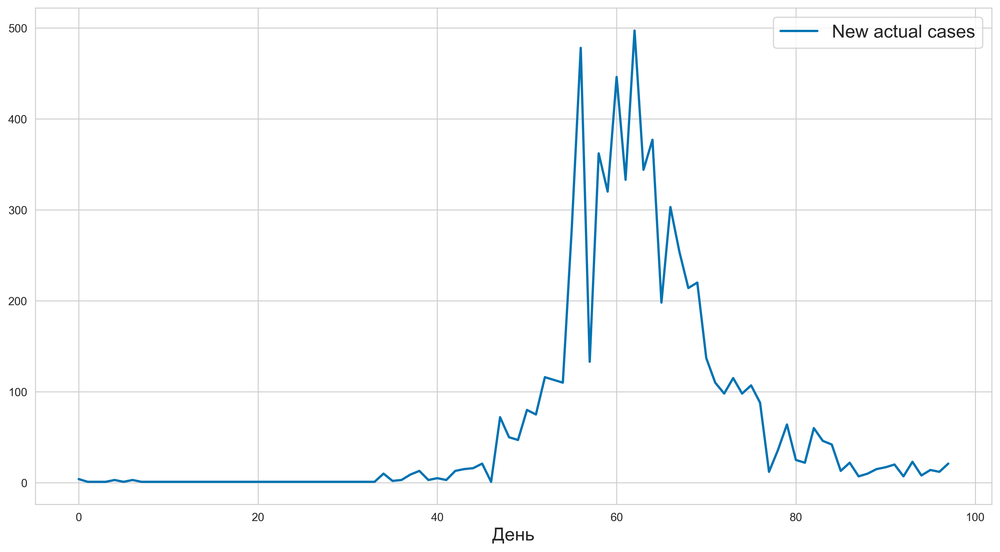

Bangladesh


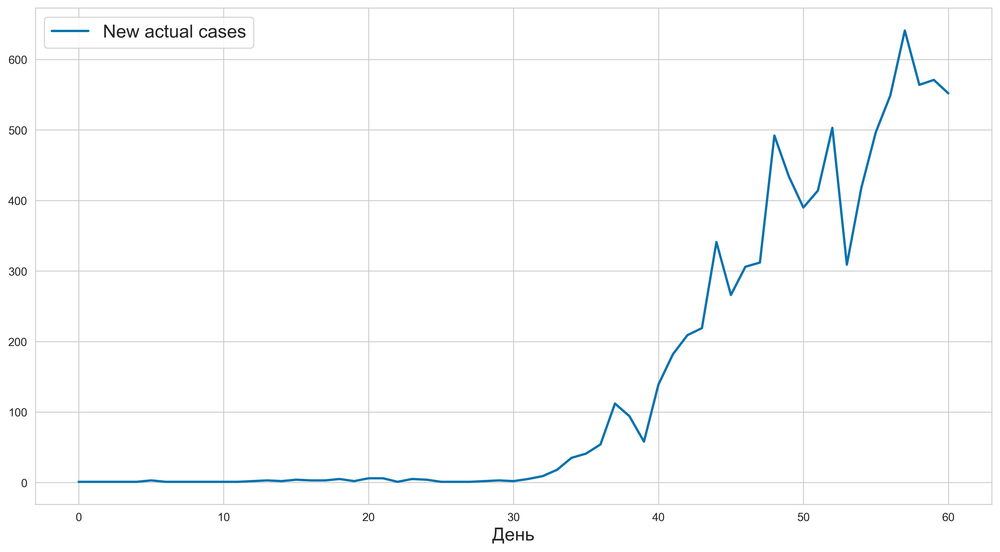

Brazil


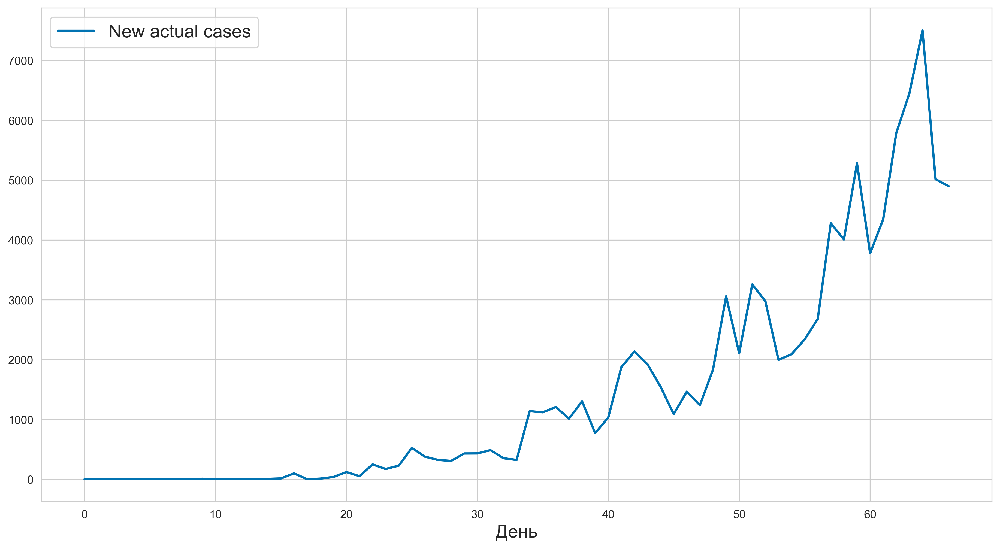

Burkina Faso


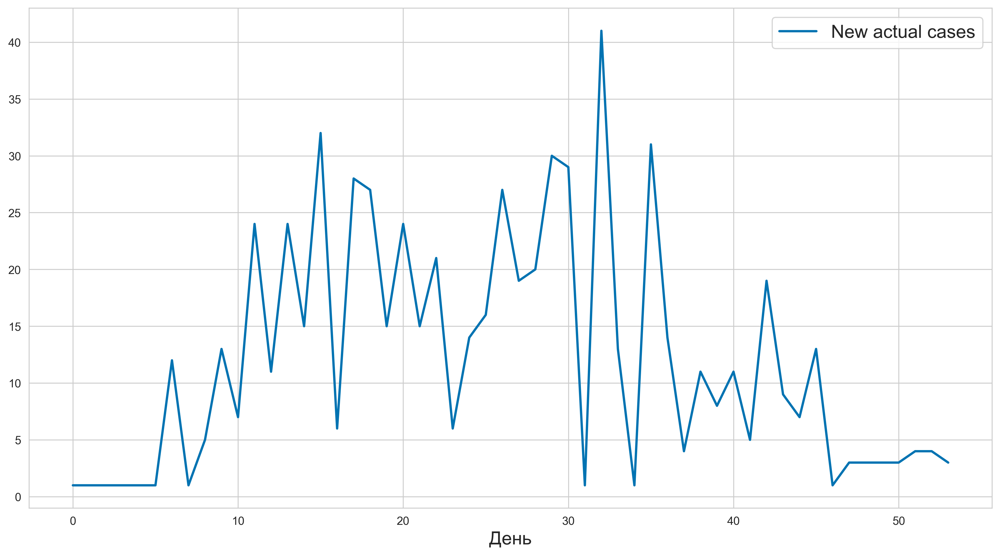

Cameroon


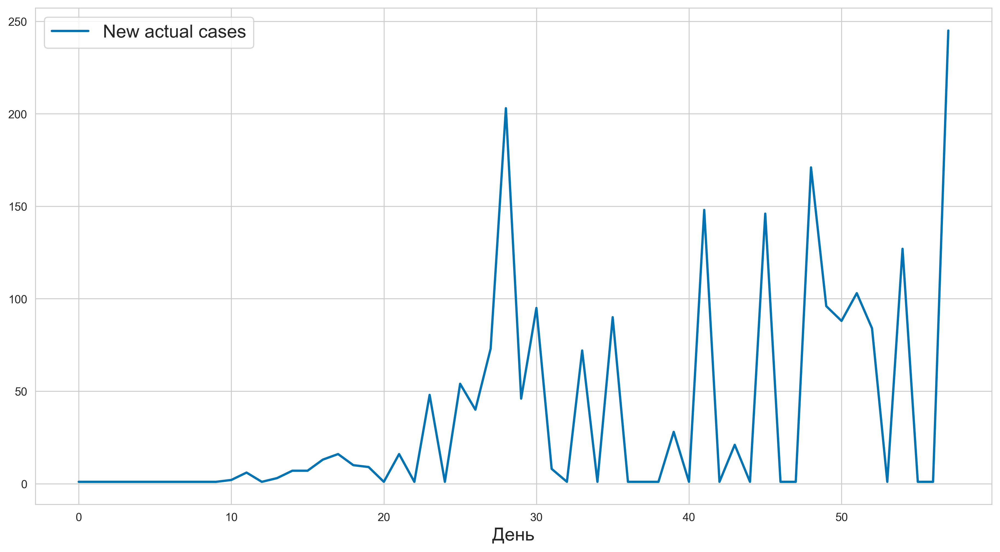

Canada


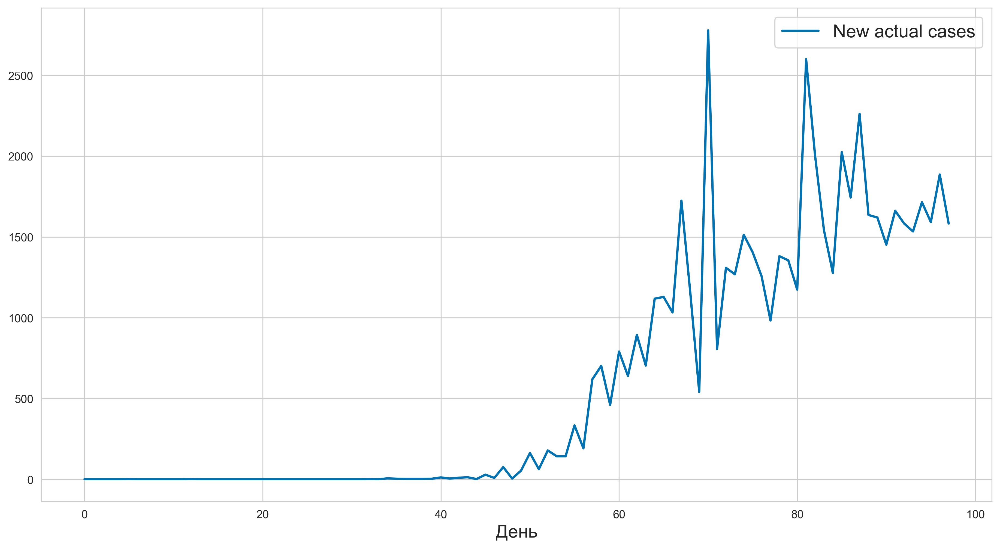

China


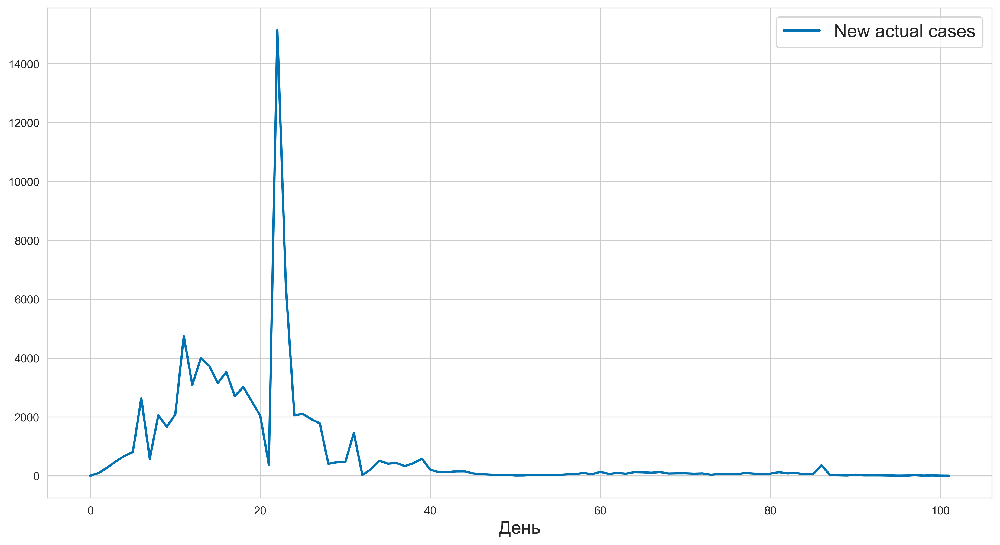

Colombia


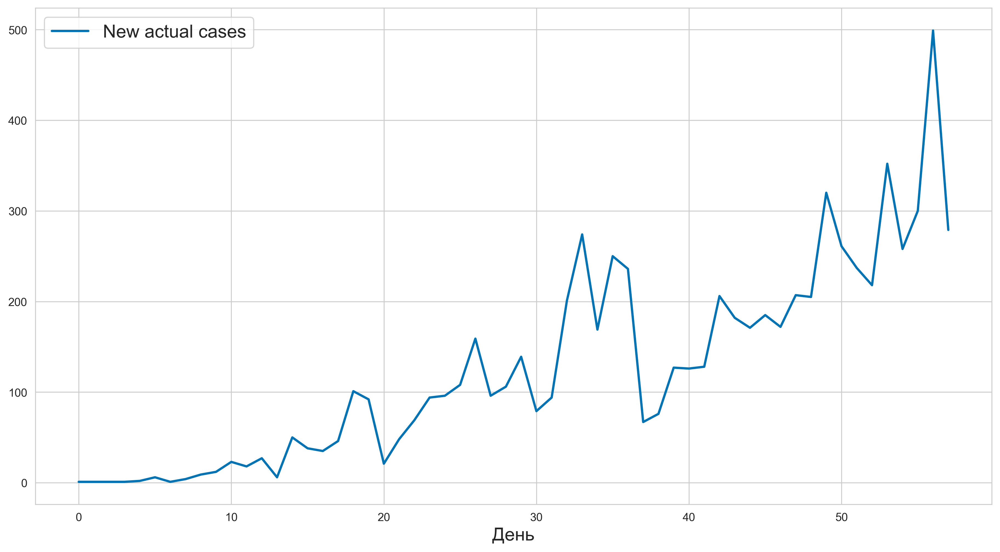

Cote d'Ivoire


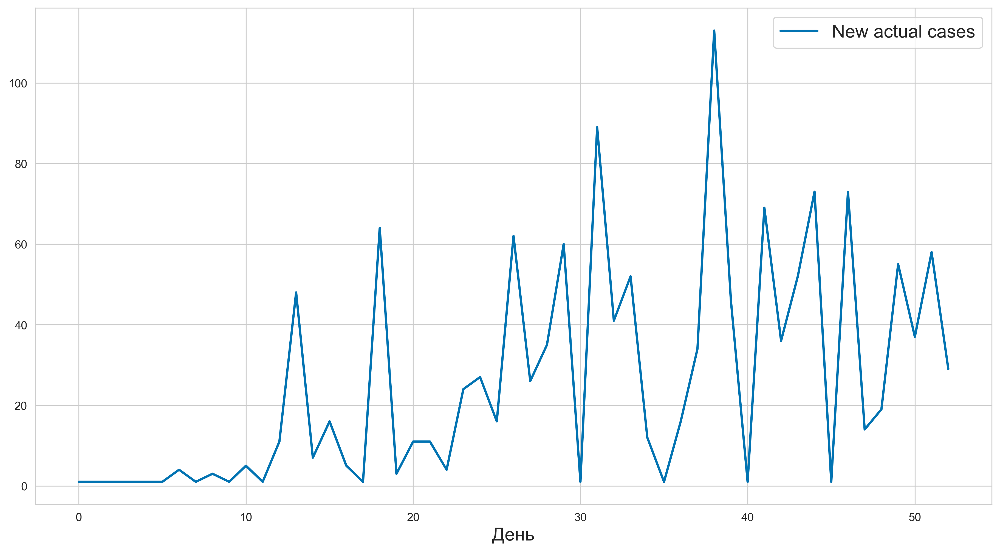

Democratic Republic of Congo


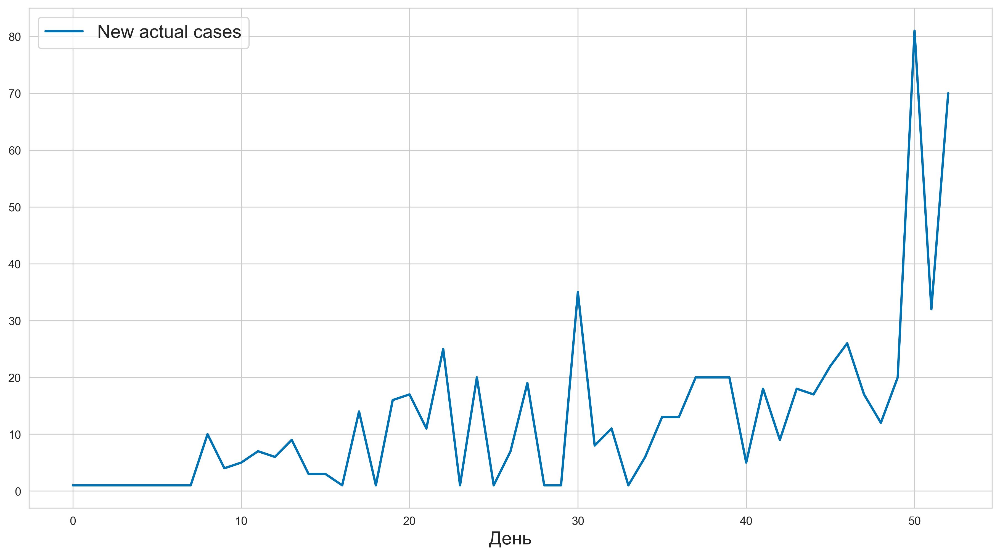

Egypt


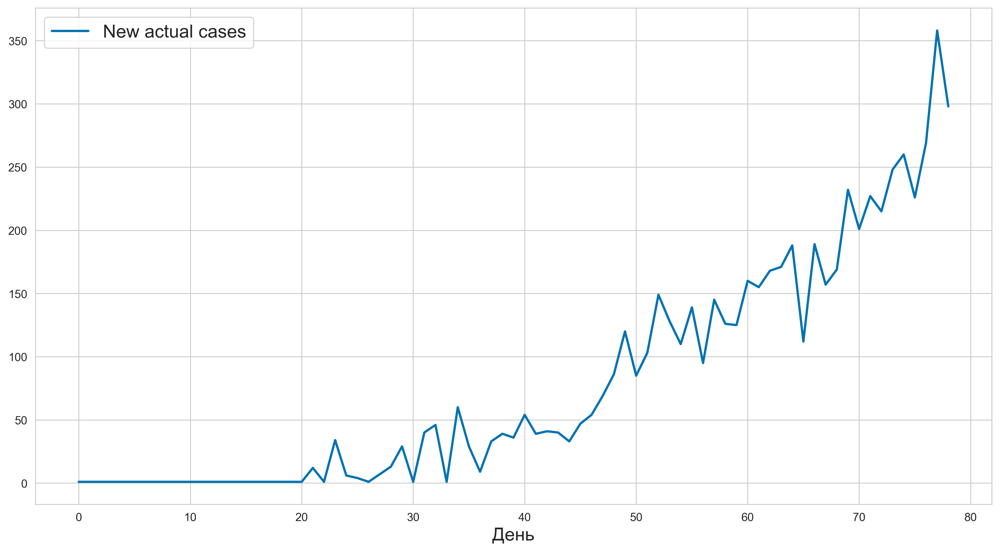

Ethiopia


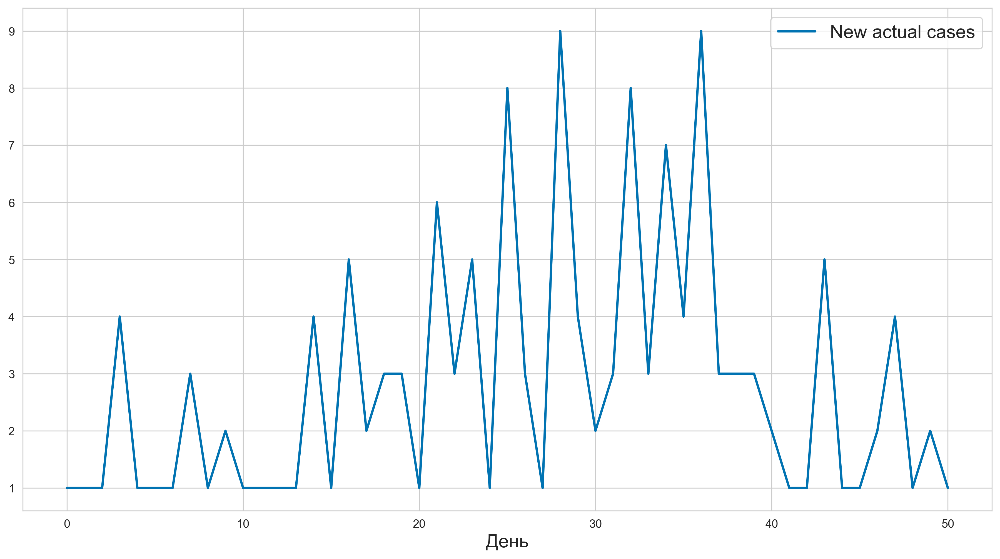

France


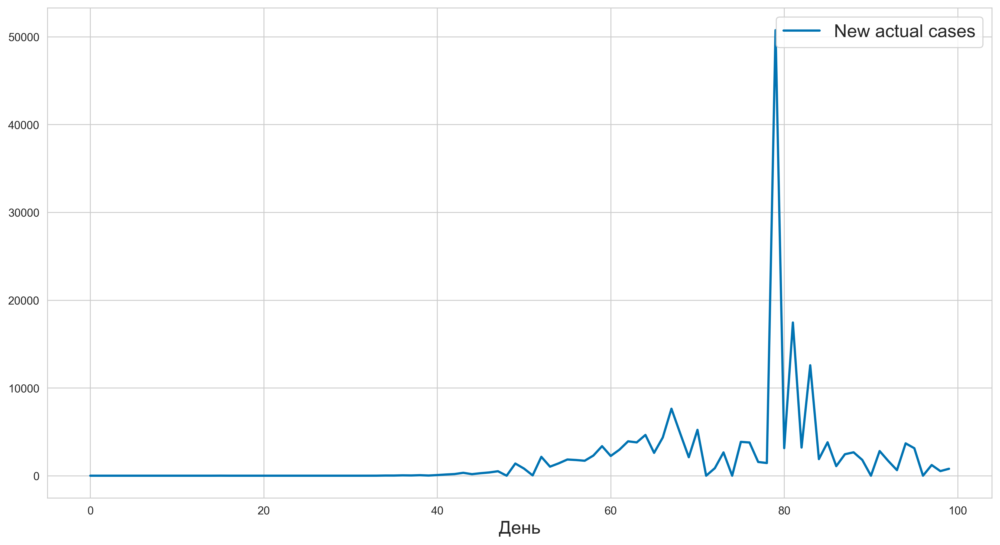

Germany


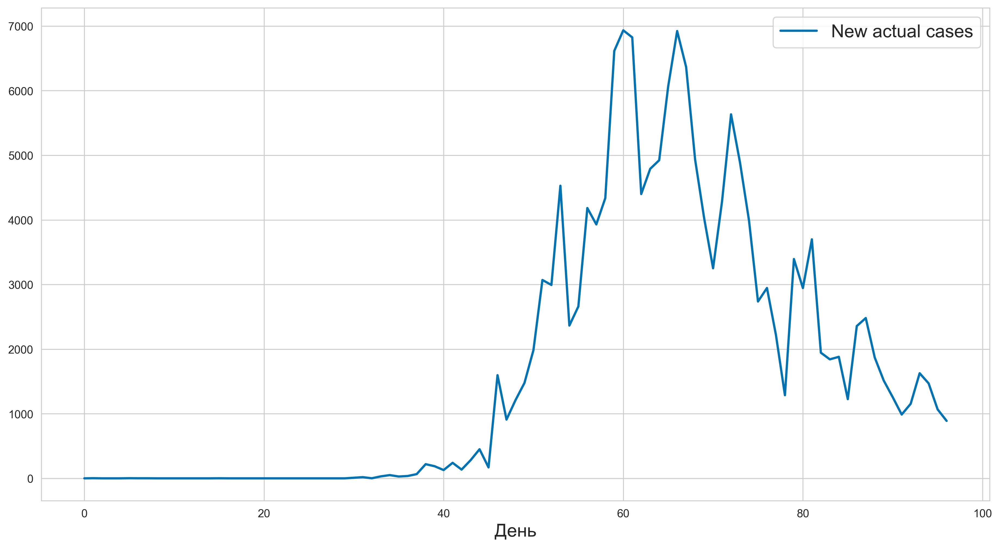

Ghana


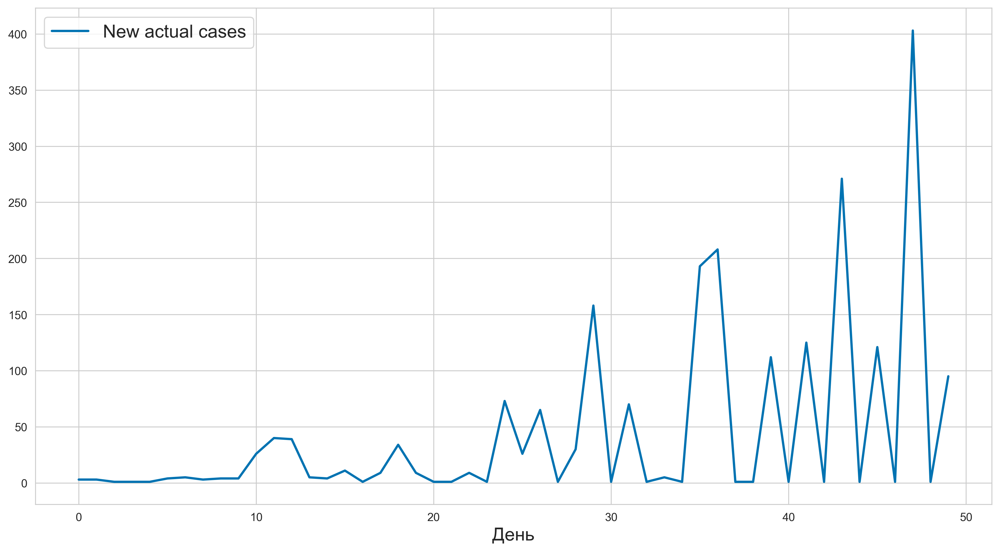

India


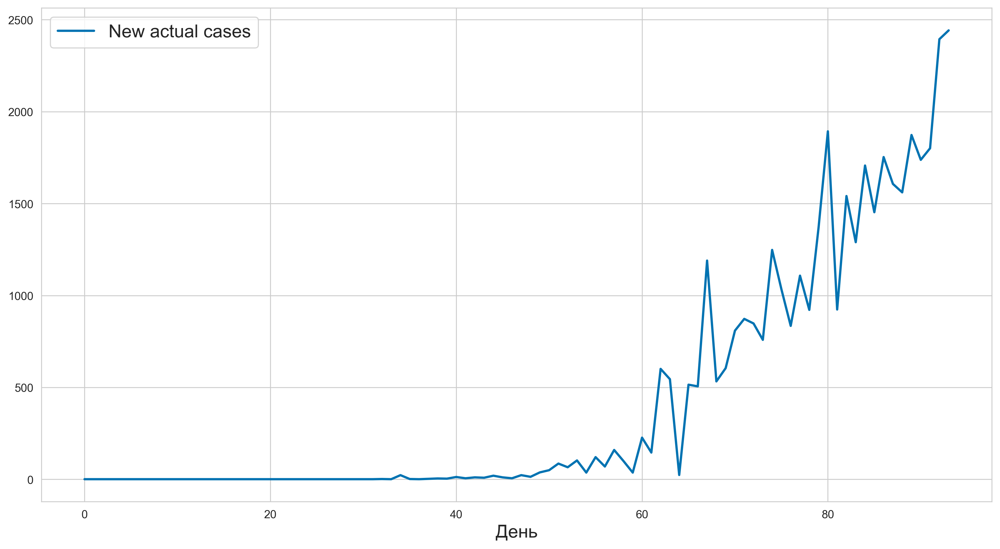

Indonesia


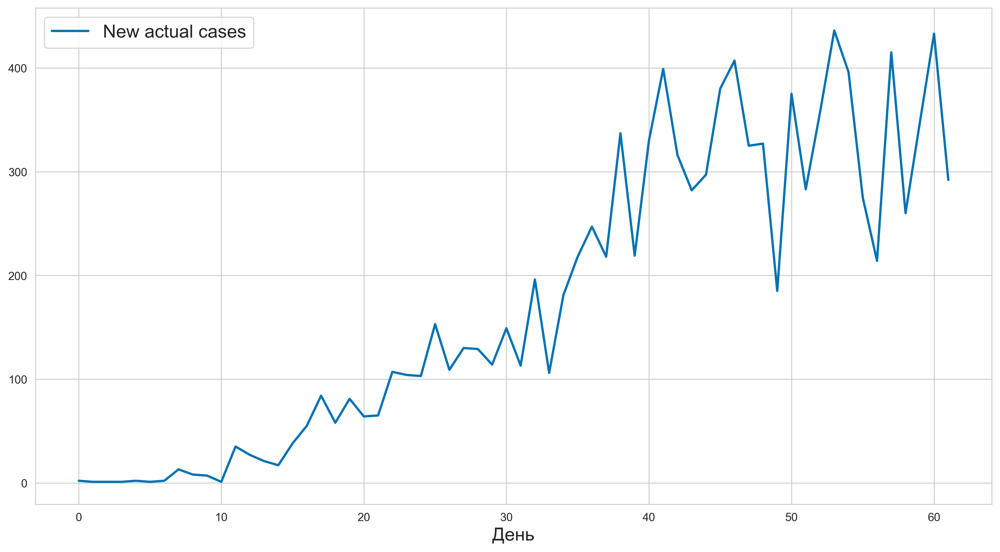

Iran


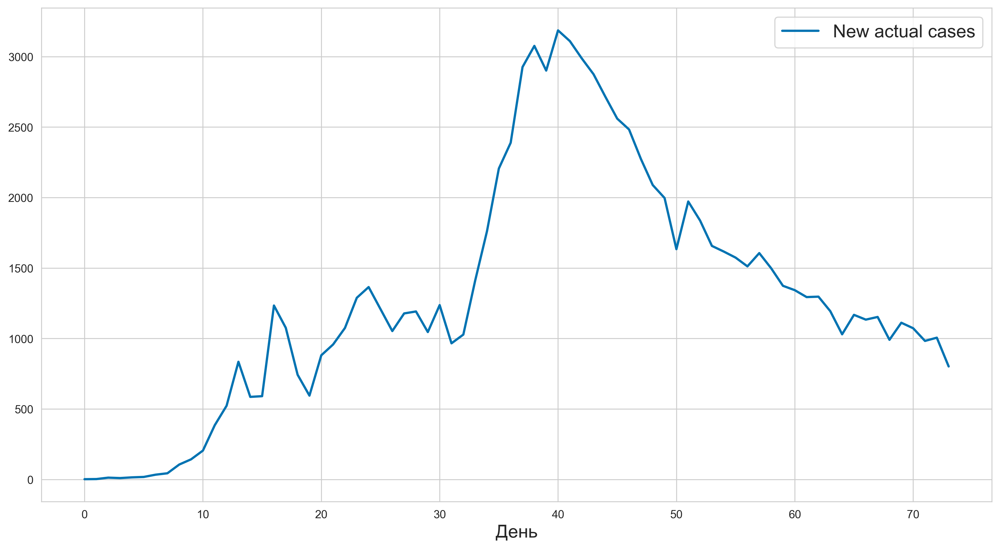

Iraq


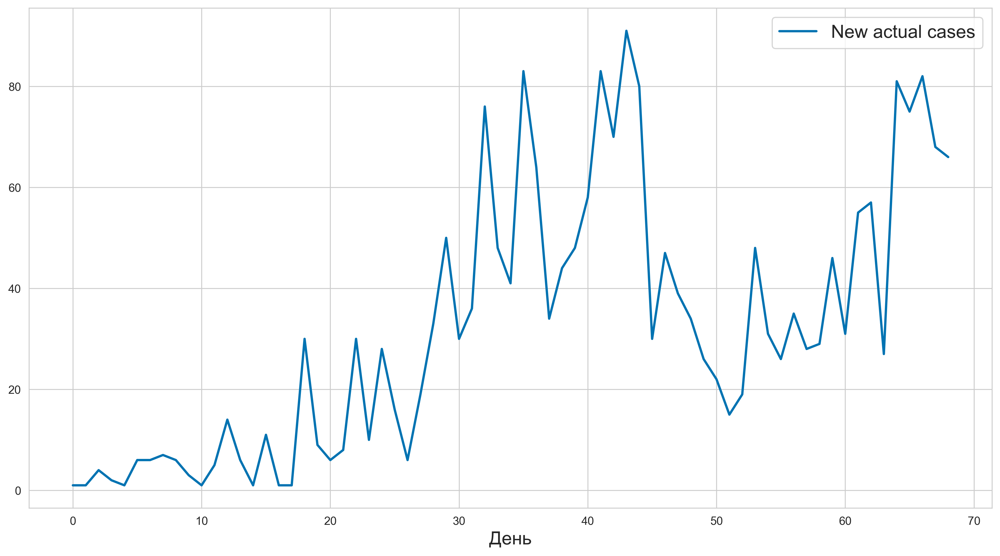

Italy


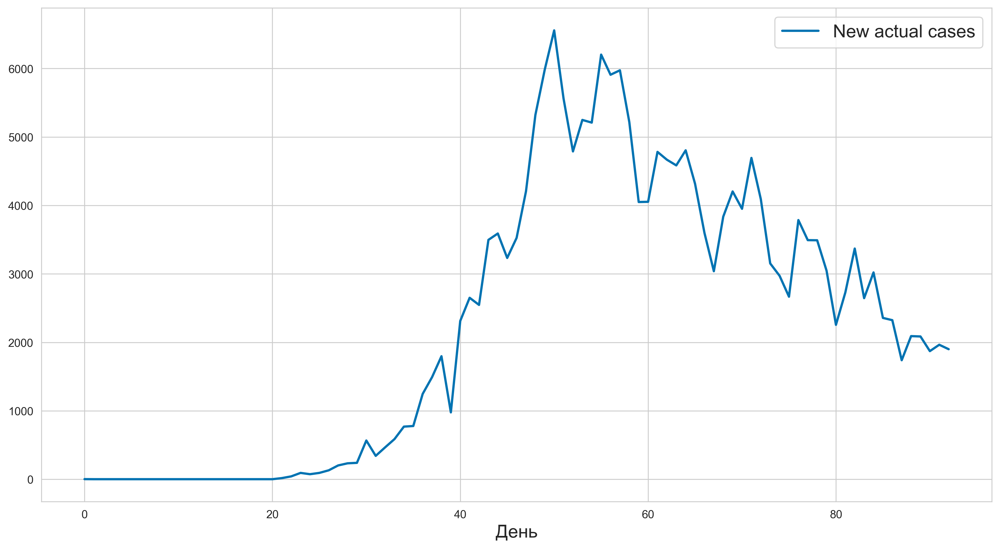

Japan


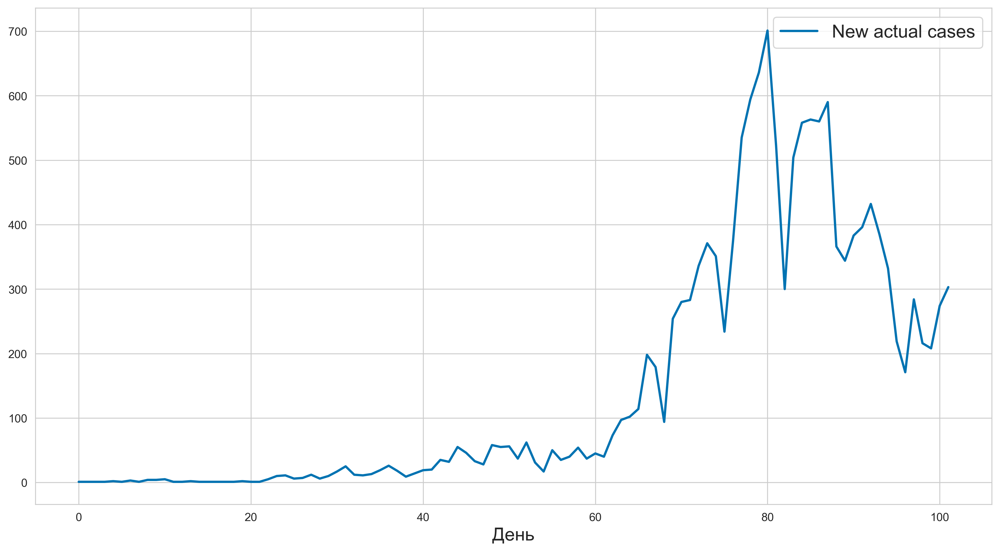

Kenya


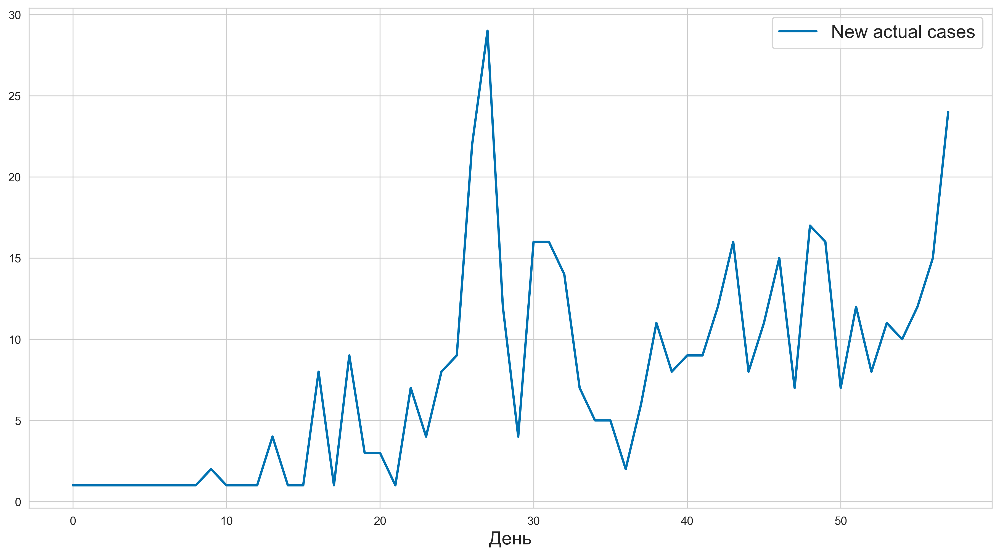

Madagascar


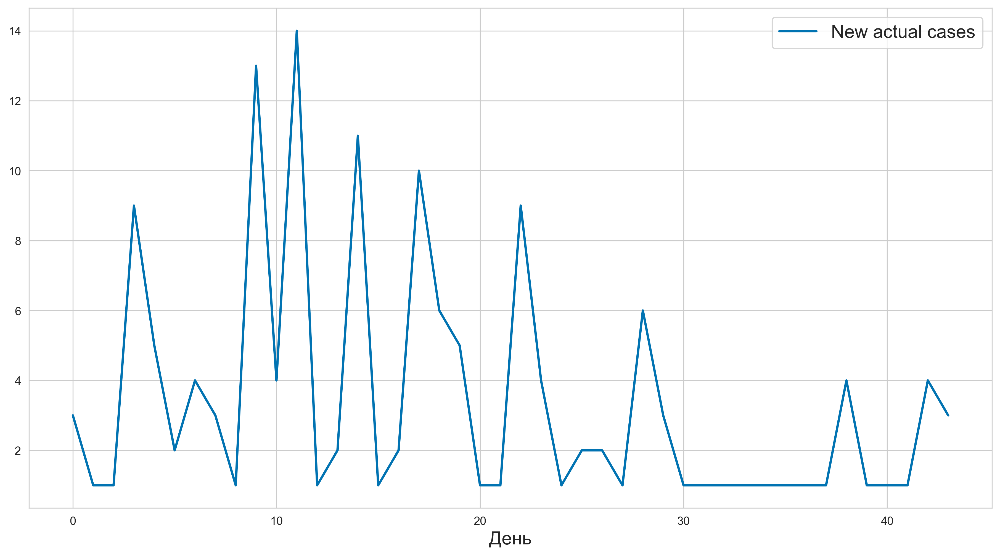

Malaysia


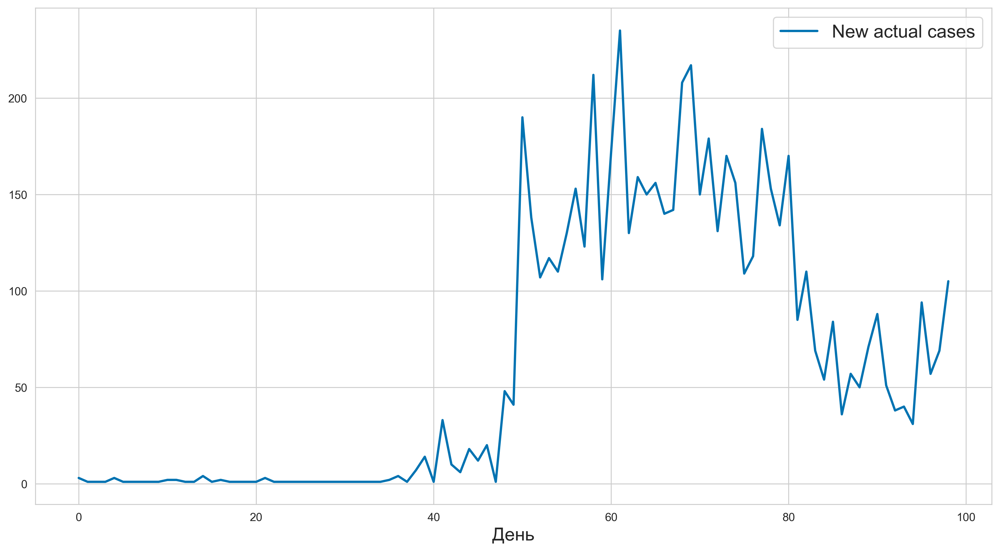

Mali


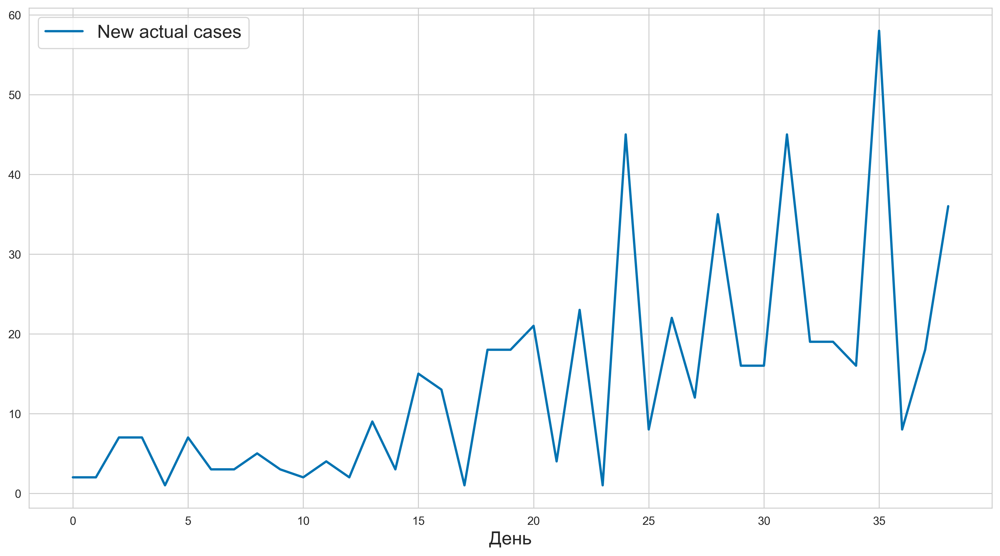

Mexico


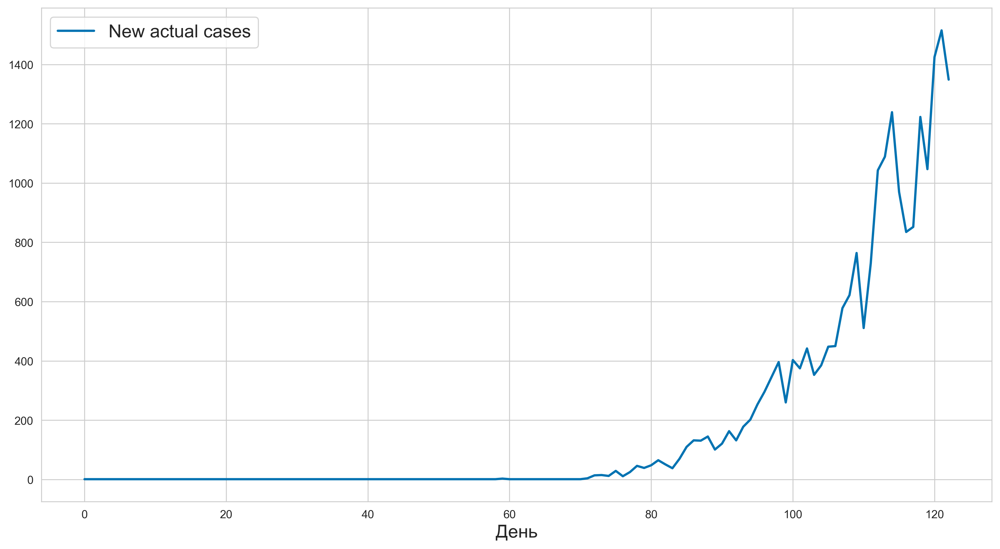

Morocco


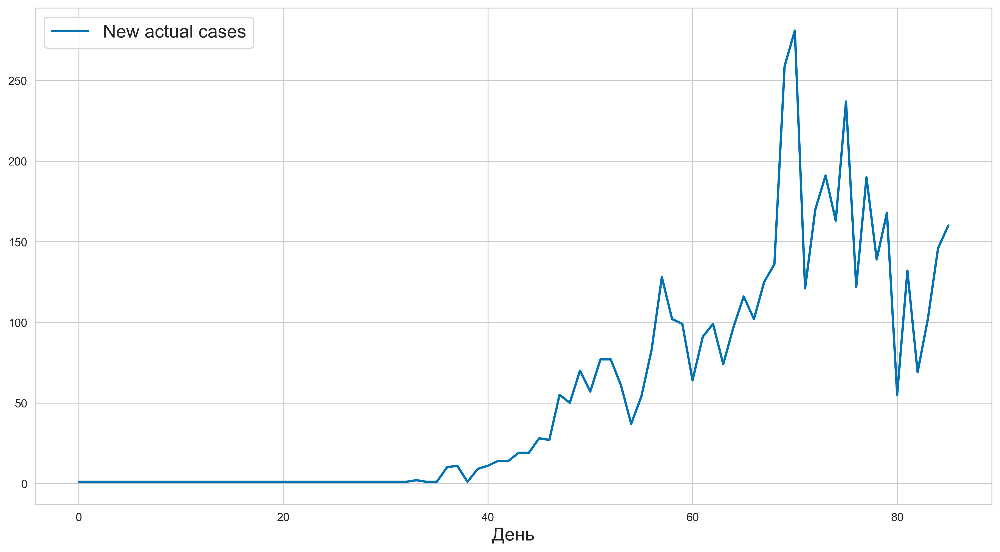

Mozambique


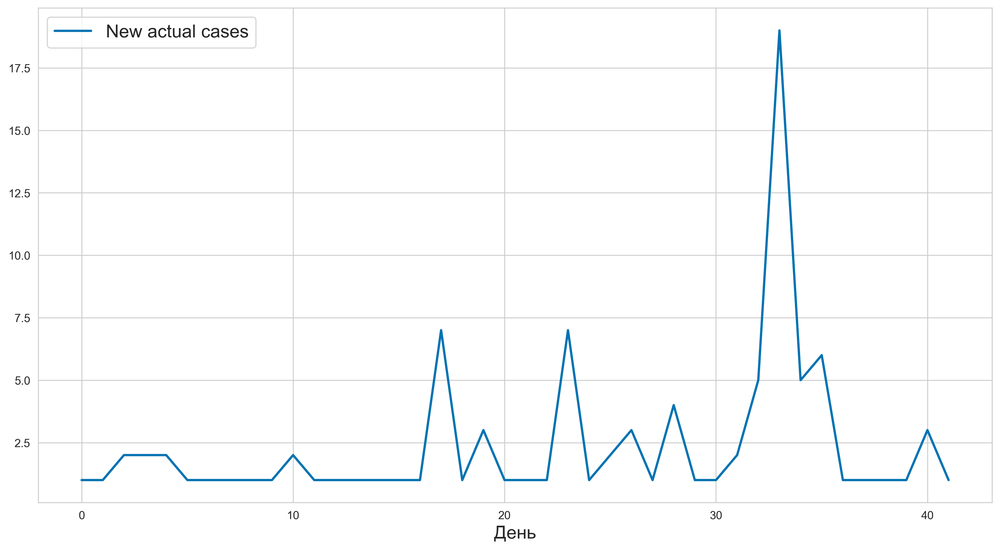

Myanmar


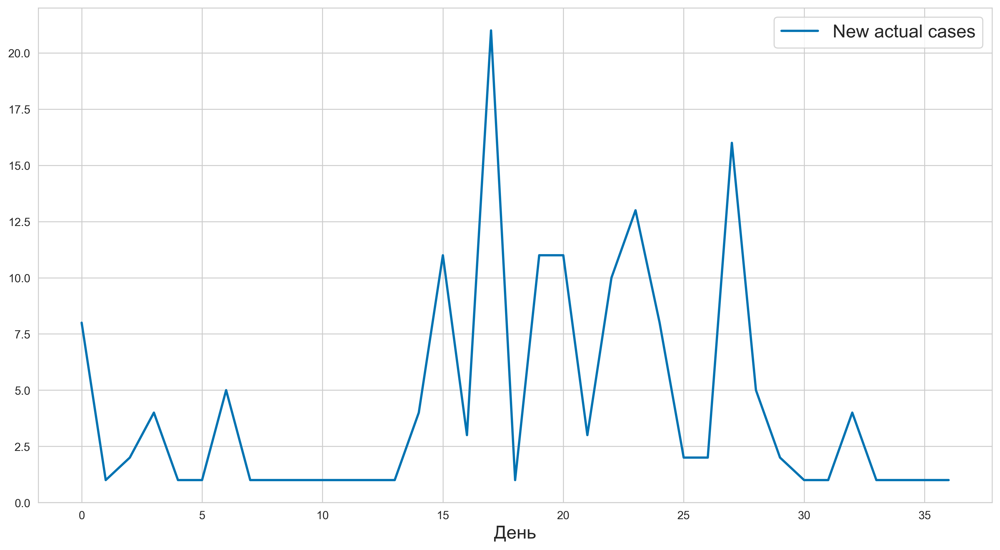

Nepal


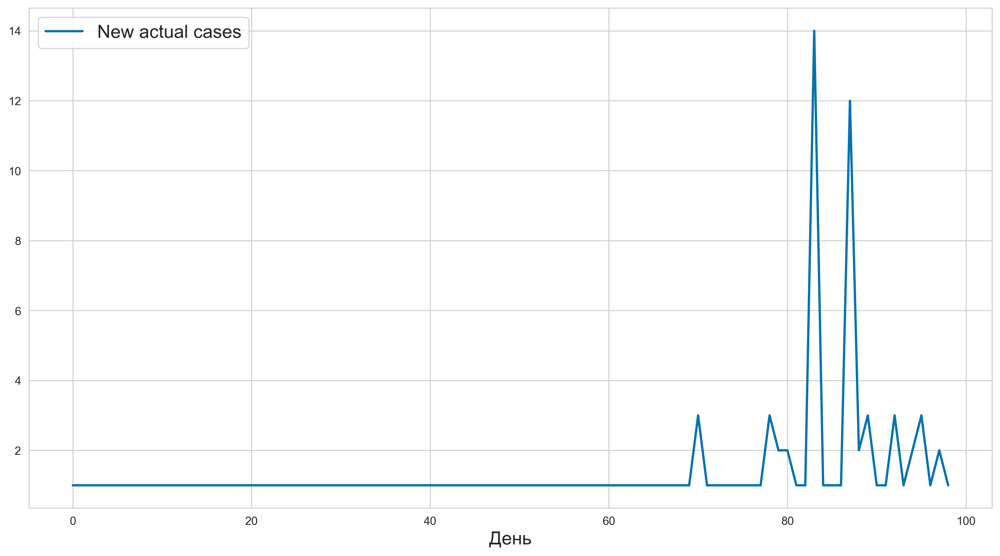

Niger


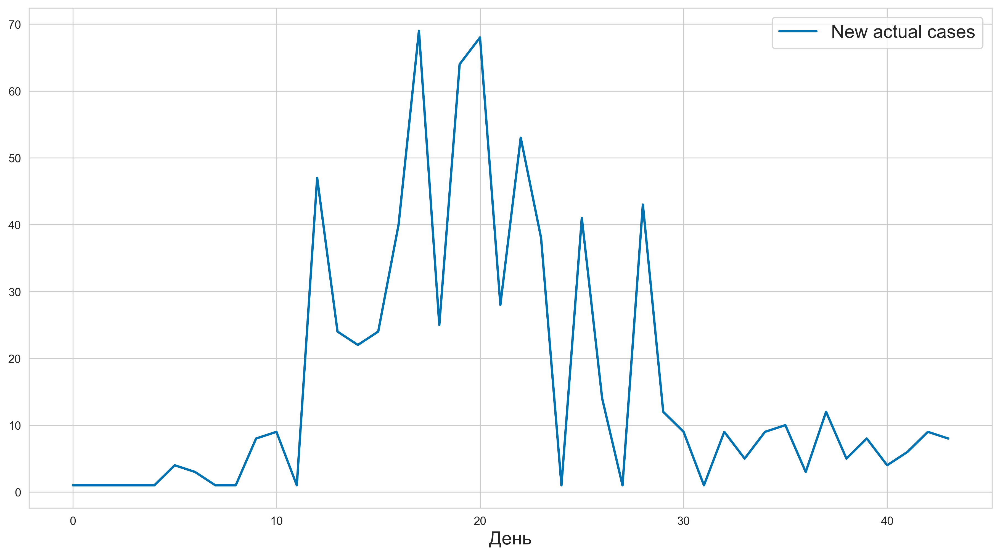

Nigeria


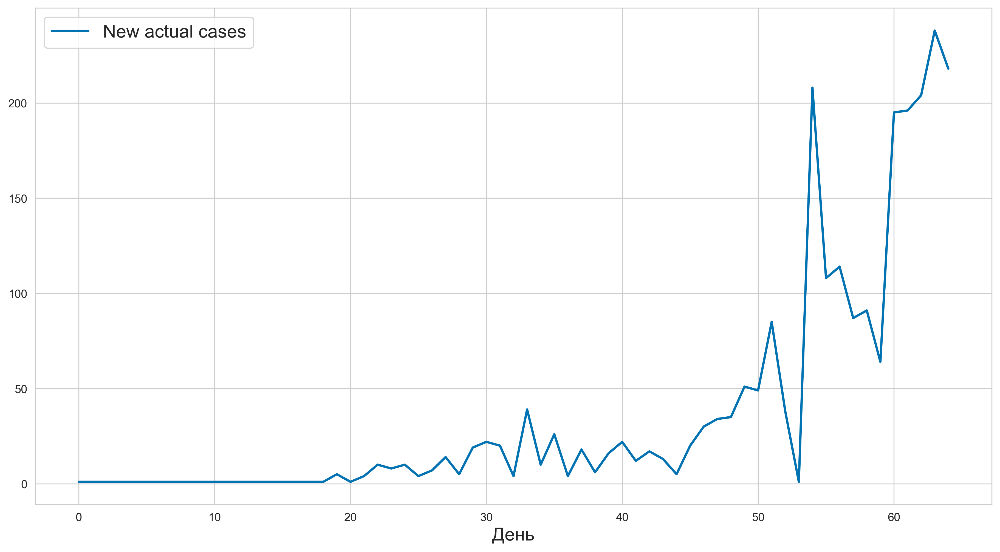

Pakistan


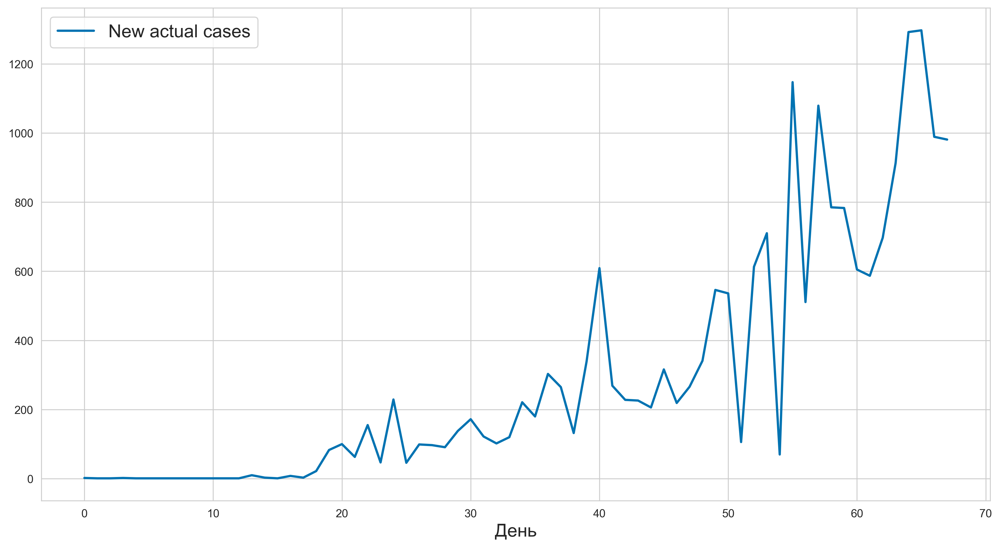

Peru


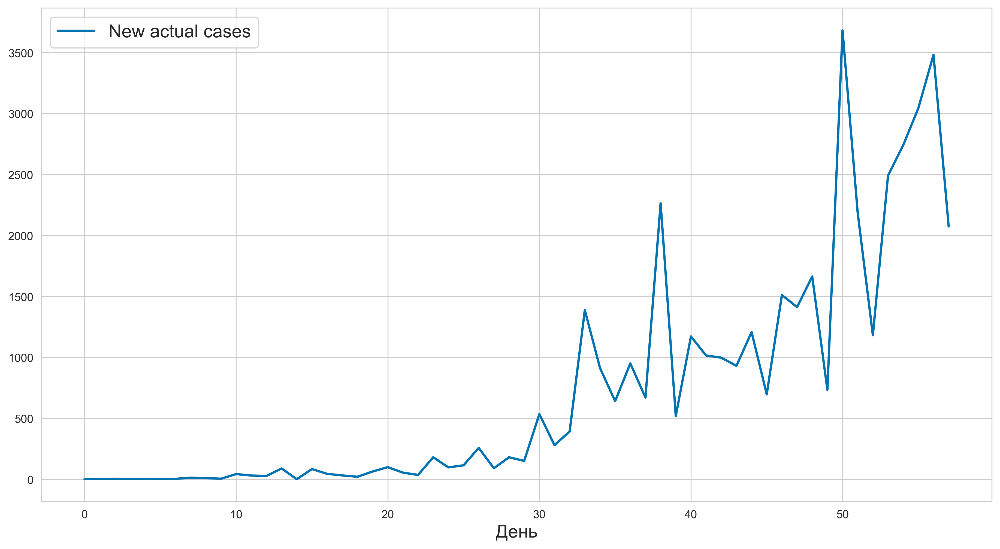

Philippines


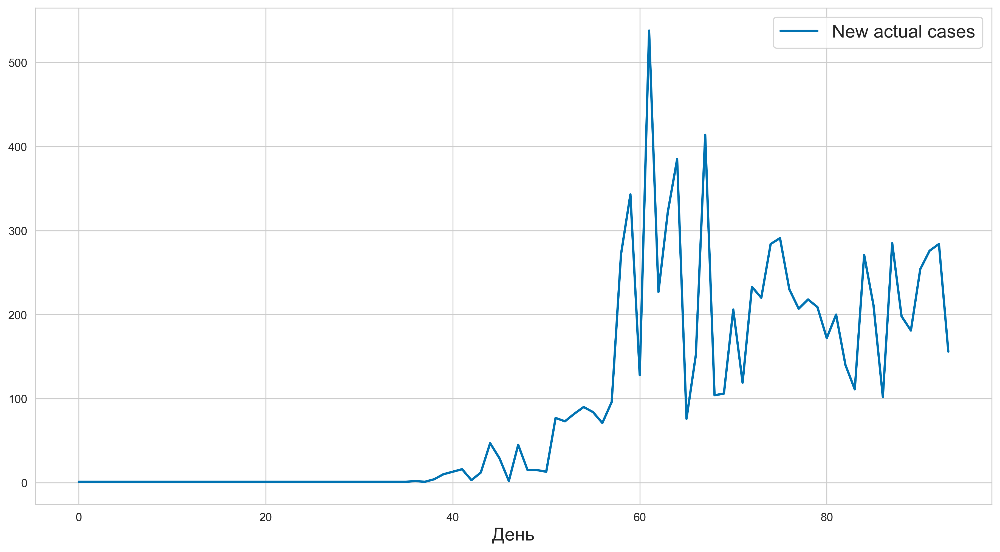

Poland


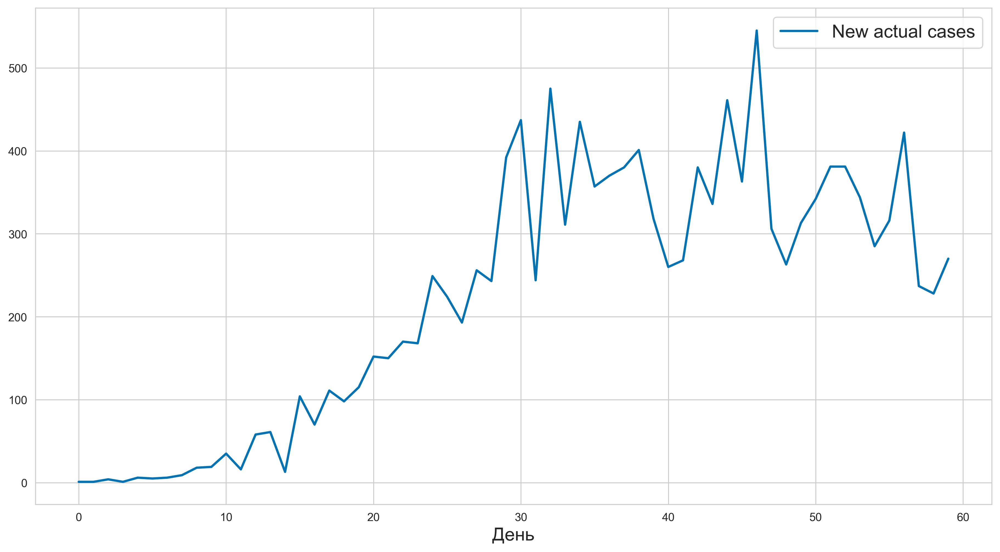

Russia


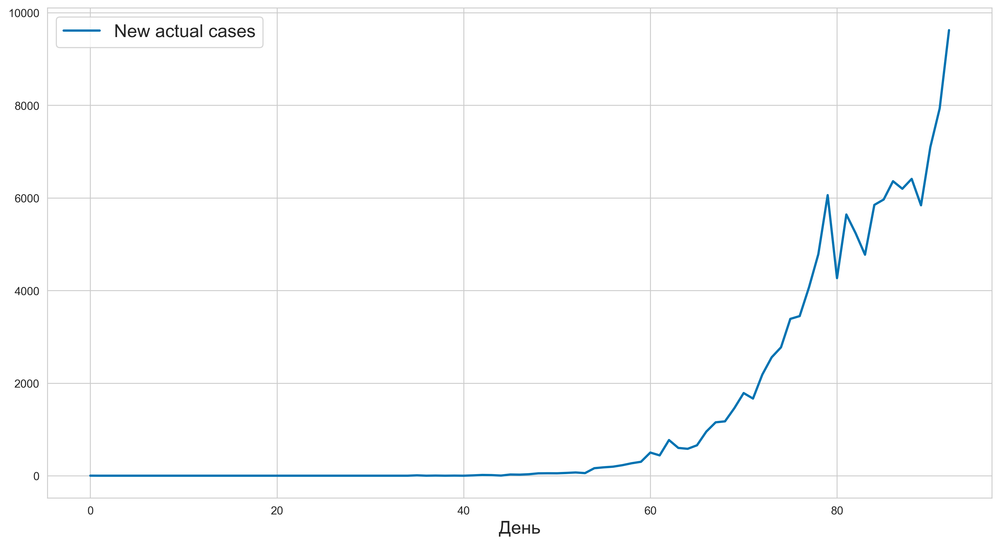

Saudi Arabia


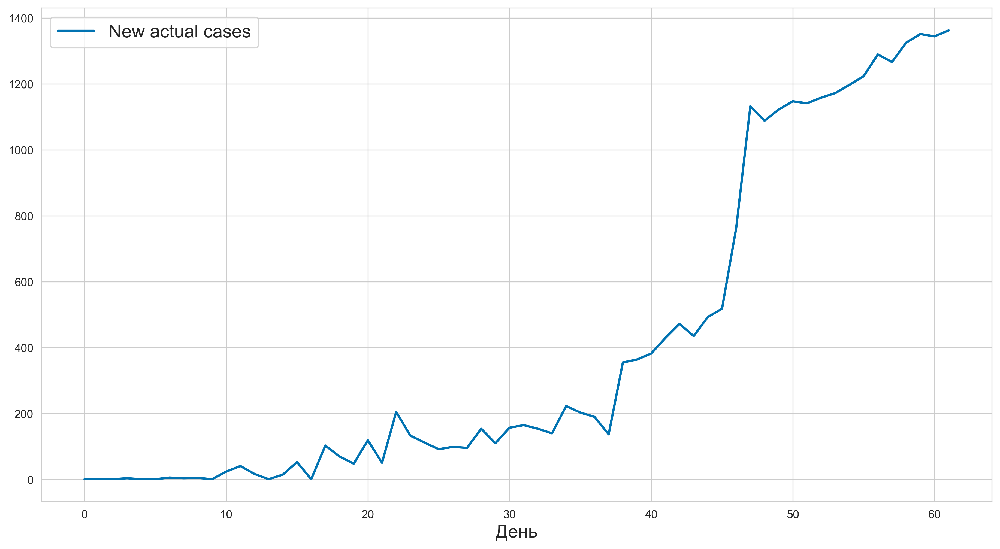

South Africa


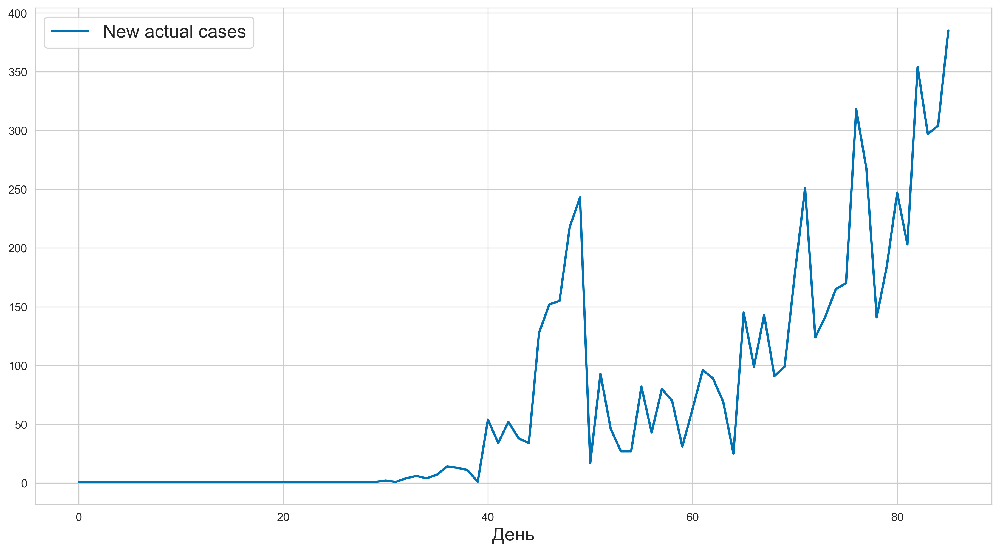

South Korea


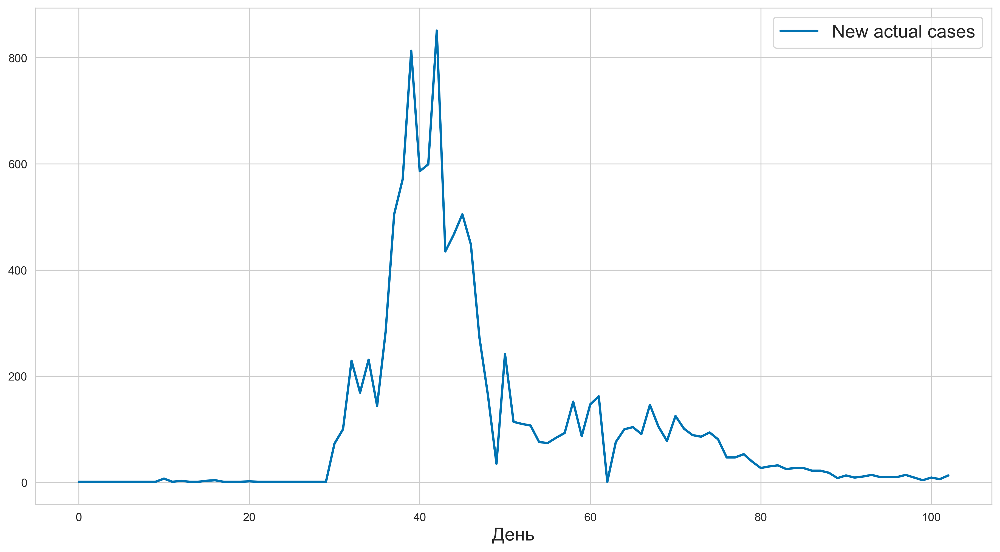

Spain


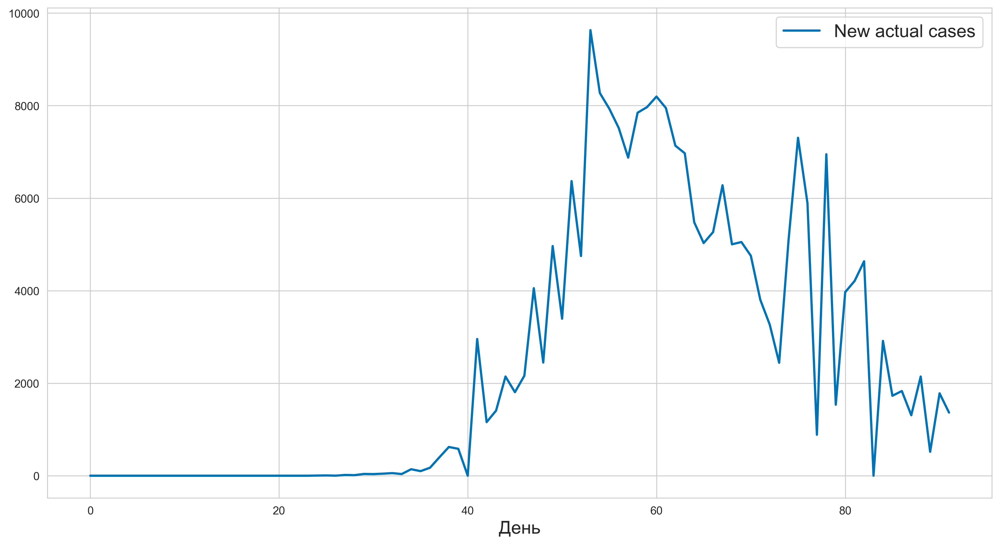

Sri Lanka


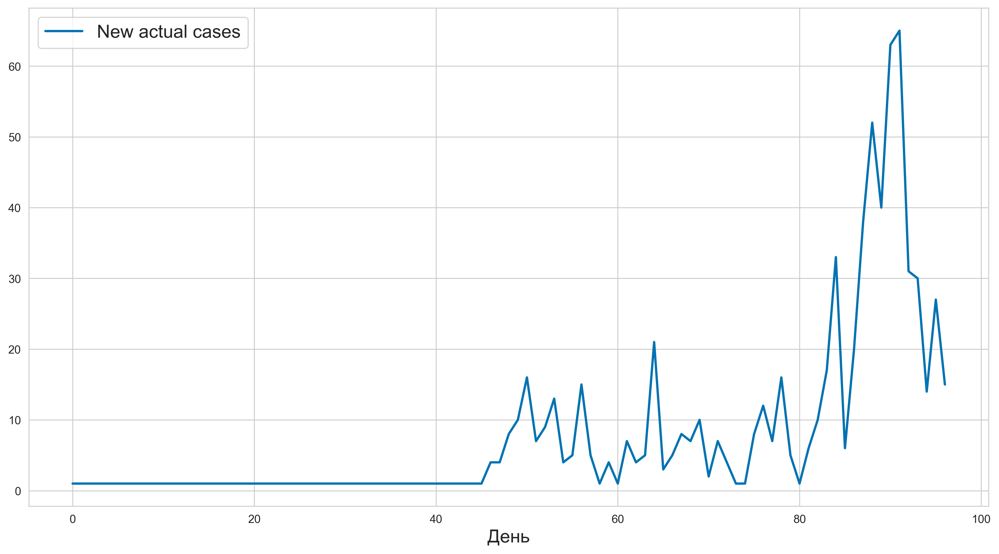

Sudan


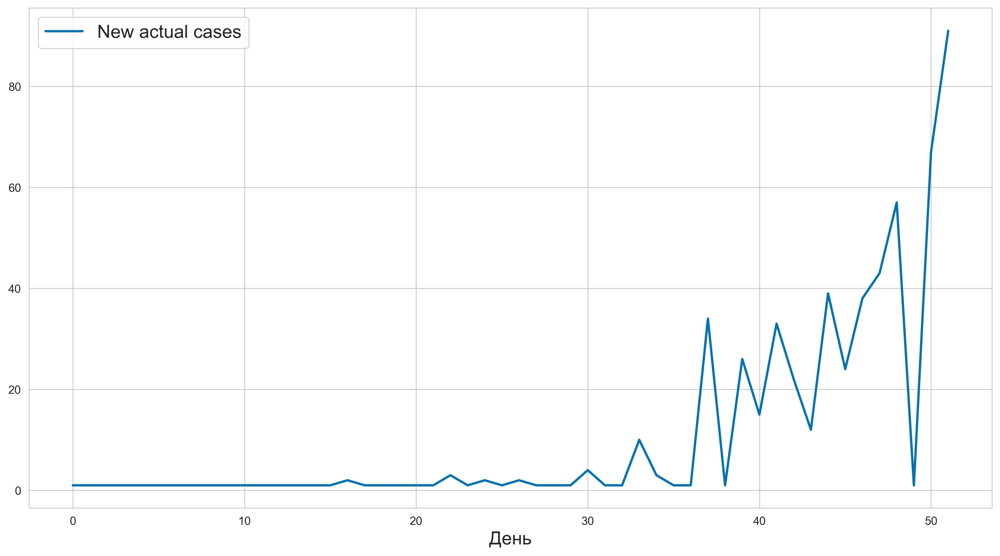

Taiwan


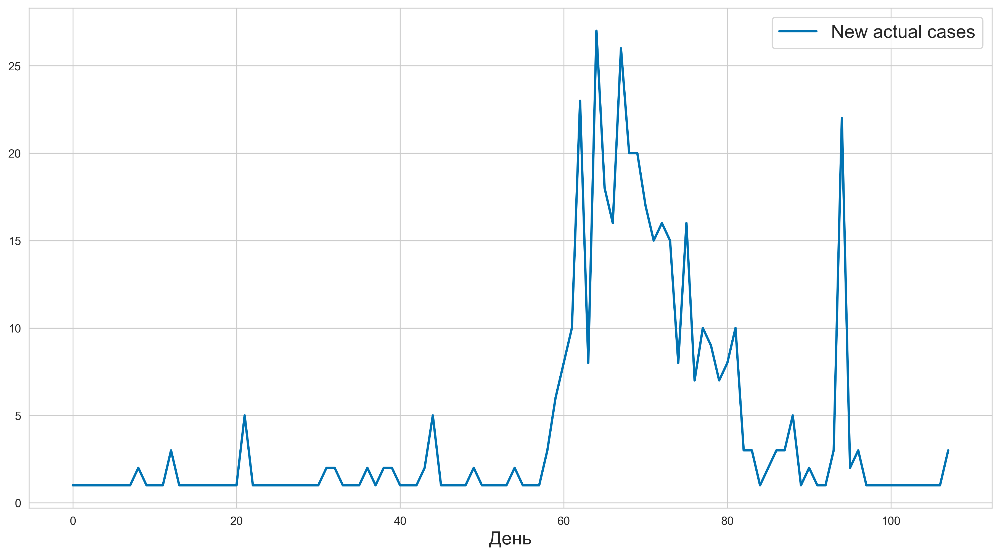

Tanzania


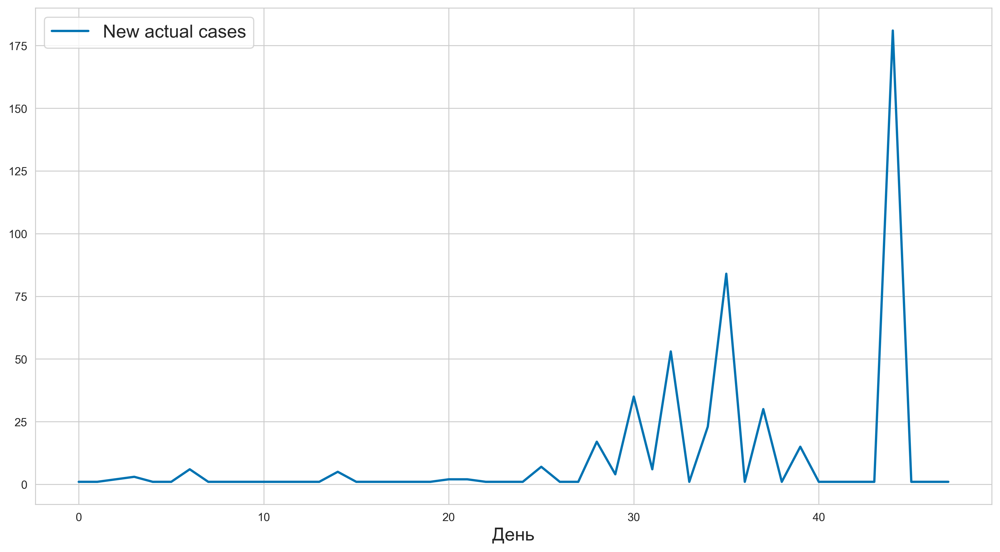

Thailand


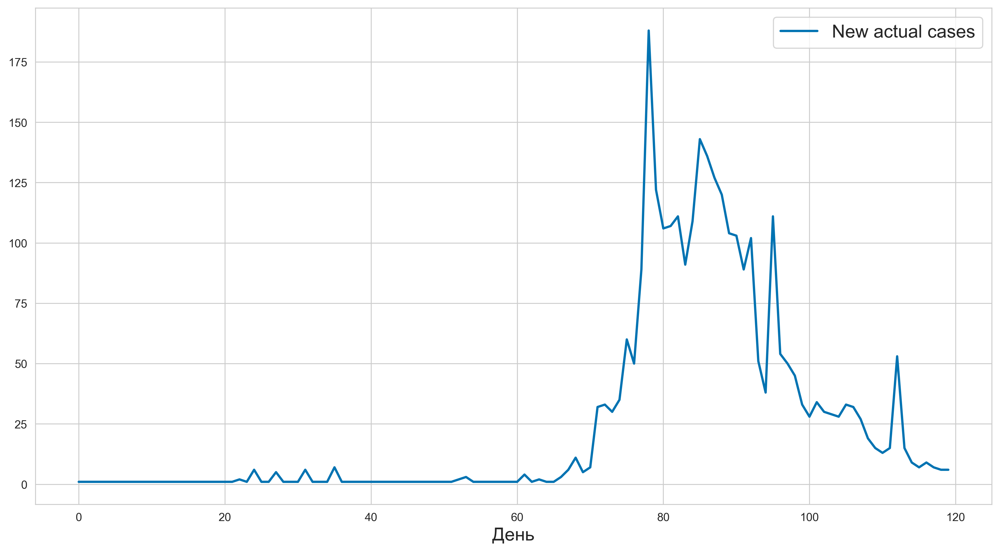

Turkey


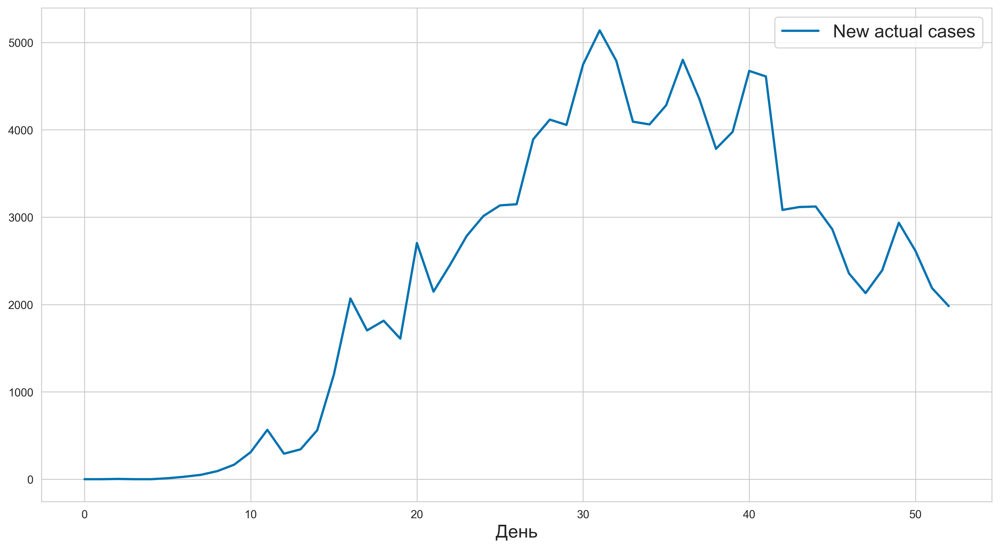

Uganda


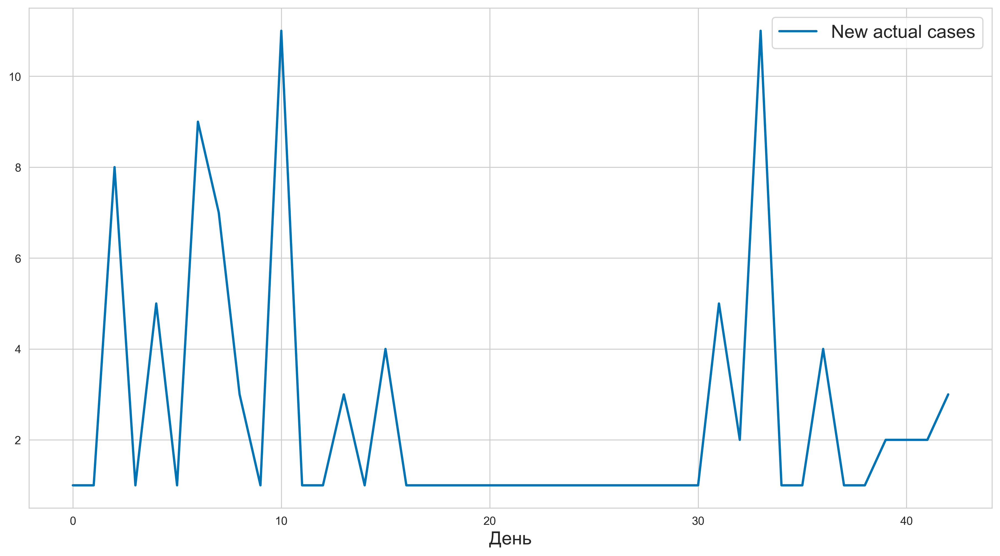

Ukraine


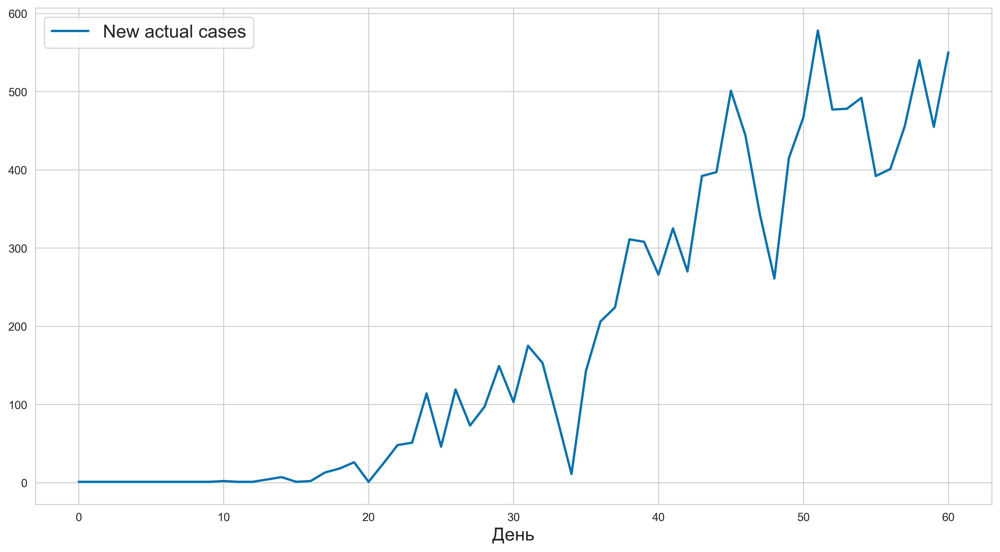

United Kingdom


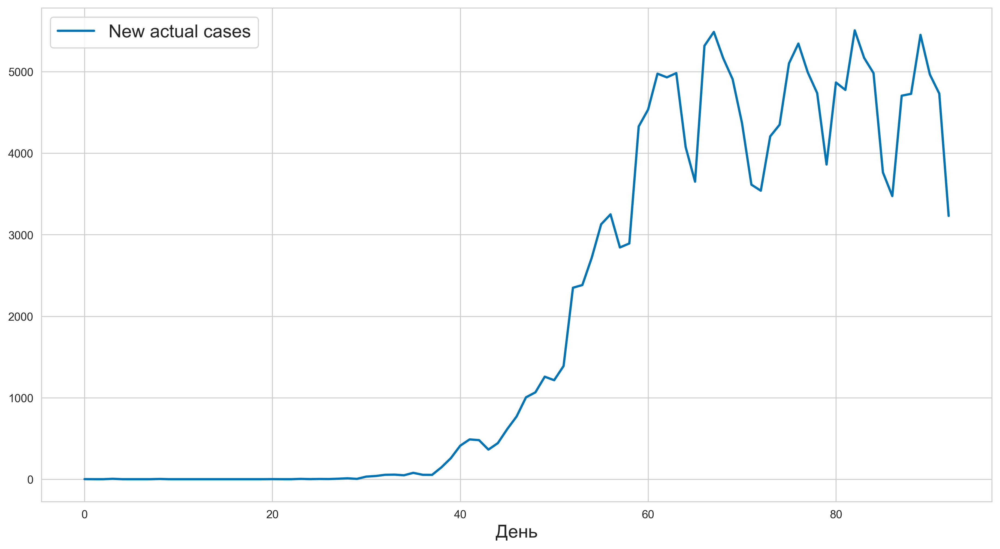

United States


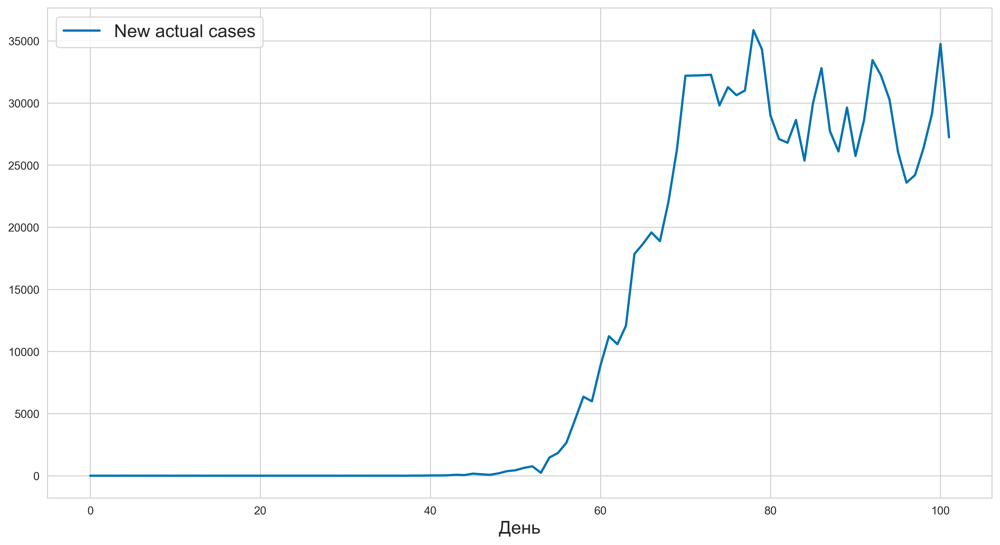

Uzbekistan


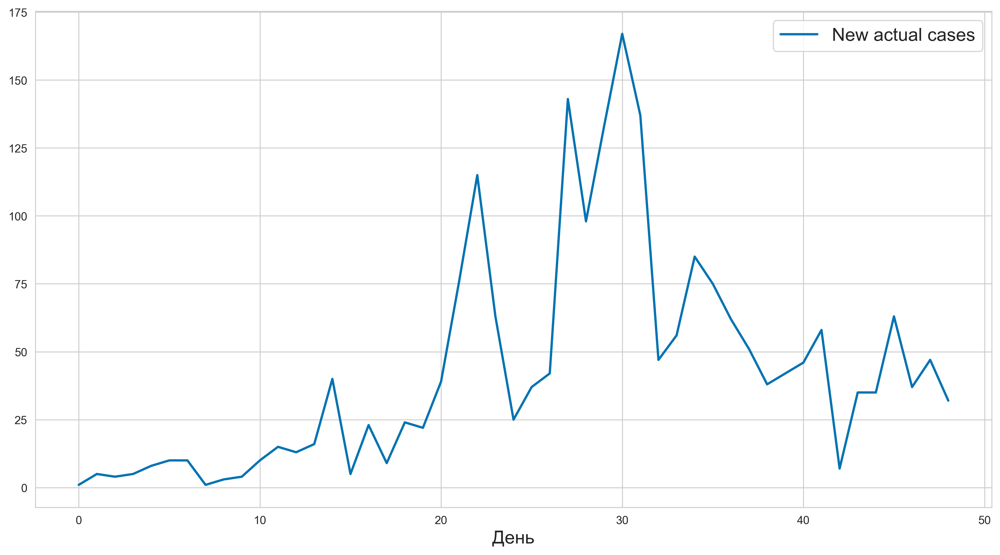

Venezuela


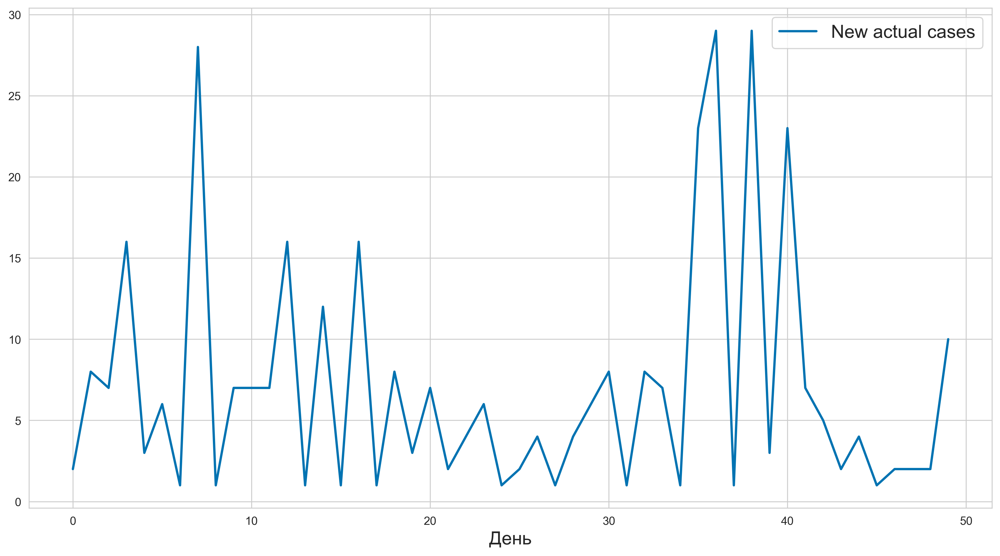

Vietnam


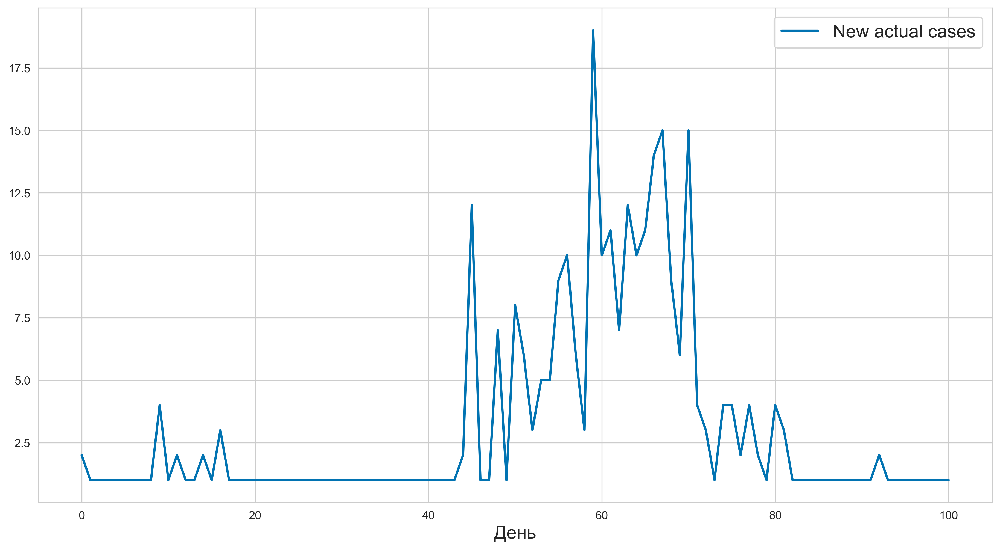

Yemen


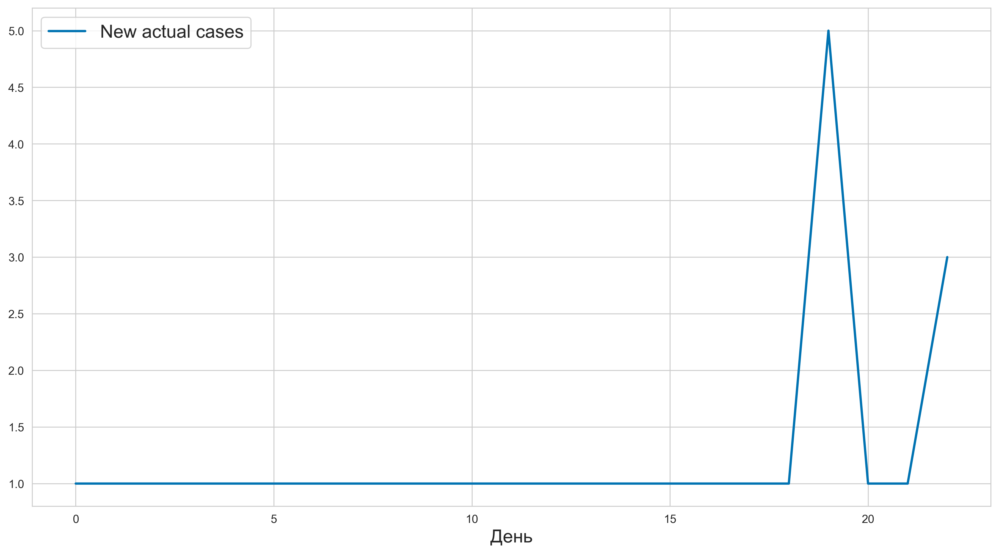

In [27]:
not_countries = ['World', 'Europe', 'European Union', 'Africa', 'Asia', 'Oceania',
                 'North America', 'South America']
countries = df[(df['population'] > 2e7) & ~df['location'].isin(not_countries)]['location'].unique()
for country in countries:
    print(country)
    temp = df[(df['location'] == country) & (df['date'] <= '2020-05-02')].reset_index()
    new_cases = temp['new_cases']
#     dates = temp.iloc[:temp[temp['date'] == '2020-05-02'].index[0]]['date']
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    ax.plot(temp.index, new_cases, linewidth=2, label='New actual cases')
    ax.set_xlabel('День', fontsize=legend_fontsize)
    #ax.set_xticklabels(dates, rotation=90)
    ax.legend(fontsize=legend_fontsize)
    plt.show()

In [28]:
bad_data = ['Angola', 'Ethiopia', 'Madagascar', 'Uganda', 'Yemen']
zero_days = {'Afghanistan': 20, 'Algeria': 10, 'Argentina': 60,
             'Australia': 40, 'Bangladesh': 30, 'Brazil': 20,
            'Burkina Faso': 0, 'Cameroon': 10, 'Canada': 40,
            'China': 0, 'Colombia': 5, "Cote d'Ivoire": 5,
            'Democratic Republic of Congo': 5, 'Egypt': 20,
            'France': 40, 'Germany': 40, 'Ghana': 10, 'India': 50,
             'Indonesia': 10, 'Iran': 5, 'Iraq': 5, 'Italy': 25,
            'Japan': 40, 'Kenya': 10, 'Malaysia': 40, 'Mali': 0,
            'Mexico': 70, 'Morocco': 35, 'Mozambique': 10,
            'Myanmar': 10, 'Nepal': 70, 'Niger': 10,
            'Nigeria': 20, 'Pakistan': 15, 'Peru': 20,
             'Philippines': 40, 'Poland': 10, 'Russia': 50,
             'Saudi Arabia': 15, 'South Africa': 35,
             'South Korea': 25, 'Spain': 35, 'Sri Lanka': 40,
             'Sudan': 30, 'Taiwan': 50, 'Tanzania': 25,
             'Thailand': 60, 'Turkey': 5, 'Ukraine': 15,
             'United Kingdom': 35, 'United States': 50,
             'Uzbekistan': 0, 'Venezuela': 0, 'Vietnam': 40
            }

In [29]:
weights = pd.DataFrame(index=zero_days.keys(), columns=['w0', 'w1', 'w2'])
for country in zero_days.keys():
    temp = df[(df['location'] == country)].iloc[zero_days[country]:].reset_index()
    temp['day'] = temp.index + 1
    temp['day_squared'] = temp['day'] ** 2
    # get MLE model
    train = temp.iloc[:50,:]
    y = np.log(train['new_cases'])
    X = train[['day', 'day_squared']].values
    lr_new = LinearRegression()
    lr_new.fit(X, y)
    mle_preds = lr_new.predict(X)
    # update params
    mle_noise = np.std(mle_preds - y)
    cur_mu, cur_sigma = np.zeros(3), 2 * np.eye(3)
    for i in range(len(train)):
        cur_mu, cur_sigma = bayesian_update_poly(cur_mu, cur_sigma, X[i], y[i], mle_noise)
    # write to resulting dataframe
    weights.loc[country] = cur_mu
weights['w2'] = pd.to_numeric(weights['w2'])
loc_to_cont = df[['continent', 'location']].drop_duplicates()
weights = weights.merge(loc_to_cont, left_index=True, right_on='location')

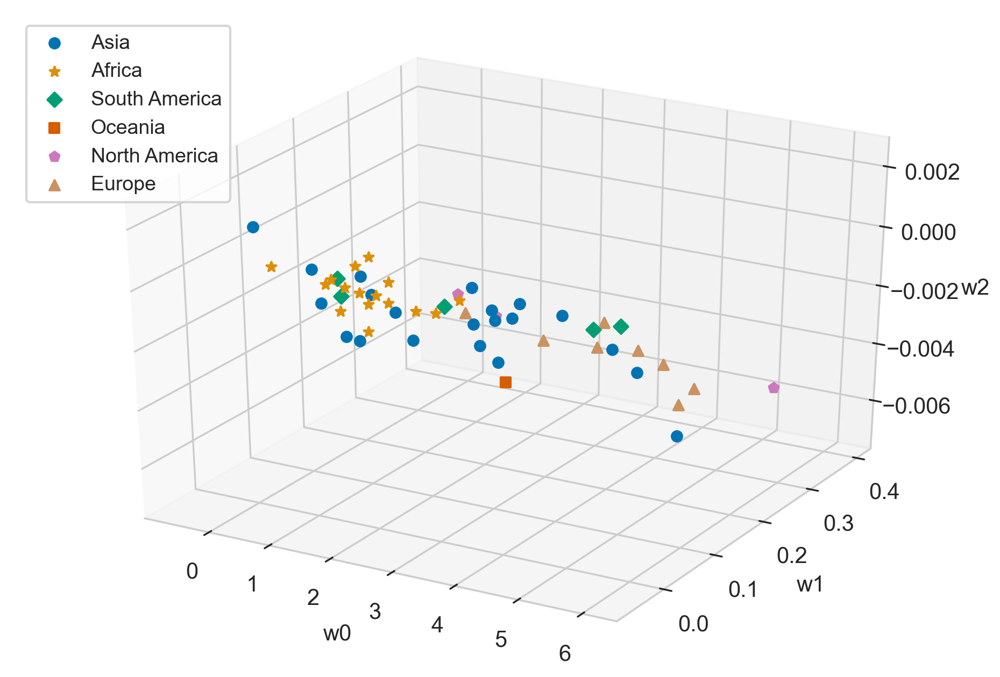

In [30]:
markers = ['o', '*', 'D', 's', 'p', '^']
fig = plt.figure()
ax = Axes3D(fig)
for i, continent in enumerate(weights['continent'].unique()):
    temp = weights[weights['continent'] == continent]
    ax.scatter3D(temp['w0'], temp['w1'], temp['w2'], depthshade=False, marker=markers[i], label=continent)
ax.set_xlabel('w0')
ax.set_ylabel('w1')
ax.set_zlabel('w2')
ax.legend(fontsize=9, loc='upper left')
plt.show()

На данном графике можно проследить некоторую связь между частью света и параметрами обученной сигмоиды: например все страны Африки четко разделяются со странами Европы, а Азия растянута практически по всей области определения (можно объяснить тем, что страны там довольно сильно различаются: как экономически, так и географически).

### Итоговый вывод

Мы провели симуляцию развития эпидемии, исходя из двух предположений: об экспоненциальном росте и о сигмоидальном (экспоненциальный с насыщением). Можно сказать, что экспоненциальная форма реалистична только в первую фазу, но через какое-то время ее предсказания перестают давать реалистичный прогноз. Предположение о сигмоидальном росте справилось с задачей лучше и смогло предсказать с некой долей точности первую волну коронавируса и падение числа новых случаев после. Однако ей не удалось предсказать дальнейший рост (вторую волну). Для моделирования дальнейшего роста скорее всего стоит применить более сложную модель (возможно многочлен n-степени / добавить других фичей / попробовать ансамбли / нейросети). Также из моделирования течения эпидемии в других странах была выделена любопытная связь части света от обученных весов линейной регрессии.

Можно использовать такие модели для принятия решений о введении карантина: например, принимать жесткие изоляционные меры в начальной фазе эскпоненциального роста (так, например было сделано в Китае, и, судя по статистике, возымело хороший эффект).